In [94]:
import pandas as pd
import numpy as np
import math
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,ElasticNet,Ridge,Lasso
from sklearn.model_selection import train_test_split, GridSearchCV,RandomizedSearchCV
from sklearn.svm import SVR
from sklearn.metrics import root_mean_squared_error,mean_absolute_error,mean_squared_error
import matplotlib.pyplot as plt

In [2]:
!unzip ./HW1_data.zip

Archive:  ./HW1_data.zip
  inflating: Capetown_temps_2020.pkl  
  inflating: Reykjavik_temps_2020.pkl  
  inflating: Urbana_temps_2023.pkl   


In [3]:
df_rey=pd.read_pickle('./Reykjavik_temps_2020.pkl')
df_cap=pd.read_pickle('./Capetown_temps_2020.pkl')

In [79]:
models = {
            'Lasso':Lasso(),
            'Ridge':Ridge(),
            'SVR':SVR()
        }

param_grids = {
    "Lasso":{"alpha": np.arange(0.1, 1.0, 0.3)},
    'Ridge':{'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}, #https://ai-ml-analytics.com/Jupyter_notebook/Blog%20-%2020%20-%20Hyperparameter%20tuning%20using%20Ridge%20and%20Lasso%20Regression.html
    'SVR':{'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}   #https://www.geeksforgeeks.org/svm-hyperparameter-tuning-using-gridsearchcv-ml/
}

In [169]:
class IS507ForecastModels:
  def __init__(self,df,time,models,params,SearchGrid:bool,standardize:bool):
    self.df=np.array(df)
    self.time=time
    self.models=models
    self.params=params
    self.option=SearchGrid
    self.standardize=standardize
    plt.plot(df,'g', label='line1', linewidth=5)
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True, color='k')
    plt.show()
    self.df_max=self.df.max()
    self.df_min=self.df.min()
    if self.standardize:
      self.df = (self.df - self.df_min) / (self.df_max - self.df_min)


  def time_split_data(self):
    return_list = []
    data_length = len(self.df)
    TIME_FRAME = self.time
    for id in range(data_length):
        # Stop when the remaining elements are less than or equal to TIME_FRAME
        if data_length - id <= TIME_FRAME:
            break
        try:
            # Append the time frame and the element following the time frame
            return_list.append([self.df[id:id+TIME_FRAME], self.df[id+TIME_FRAME]])
        except IndexError:
            # If indexing goes out of range, handle it
            continue

    return return_list

  def split_data(self):
    data=self.time_split_data()
    X=[x[0] for x in data]
    Y=[x[1] for x in data]
    X_TEST=X[-10:]
    Y_TEST=Y[-10:]
    x_train,x_val,y_train,y_val=train_test_split(X[:-10],Y[:-10],test_size=0.1,random_state=42,shuffle=True)
    return (x_train,x_val,y_train,y_val,X_TEST,Y_TEST)

  def inverse_transform(self, data):
    return (np.array(data) * (self.df_max - self.df_min)) + self.df_min

  def train(self):
    x_train,x_val,y_train,y_val,X_TEST,Y_TEST=self.split_data()
    if self.standardize==True:
      y_val= self.inverse_transform(y_val)
      Y_TEST= self.inverse_transform(Y_TEST)
    #Implement the gridsearchcv option or the randomsearchcv option
    if self.option==True:
      results={}
      for model_name,model in self.models.items():
        grid_based_search=GridSearchCV(model,self.params[model_name],cv=5,verbose=2)
        grid_based_search.fit(x_train,y_train)

        #get validation test set mse, the grid search by default chooses the best params
        y_pred_val=grid_based_search.predict(x_val)
        y_pred_test=grid_based_search.predict(X_TEST)

        if self.standardize==True:
          y_pred_val= self.inverse_transform(y_pred_val)
          print(y_pred_val)
          y_pred_test= self.inverse_transform(y_pred_test)

        #results given back
        results[model_name]={
            "Best parameters":grid_based_search.best_params_,
            "Validation MSE":mean_squared_error(y_val,y_pred_val),
            "Test MSE":mean_squared_error(Y_TEST,y_pred_test)
        }
        #plotting the results
        plt.figure(figsize=(20,7))
        plt.plot(Y_TEST,label='Actual')
        plt.plot(y_pred_test,label='Predicted')
        plt.xlabel("Time")
        plt.ylabel("Temperature")
        plt.title(f"Model used : {model_name}")
        plt.legend()
        plt.show()

    elif self.option==False:
      results={}
      for model_name,model in self.models.items():
        random_based_search=RandomizedSearchCV(model,self.params[model_name],cv=5,verbose=2)
        random_based_search.fit(x_train,y_train)
        #get validation test set mse, the grid search by default chooses the best params
        y_pred_val=random_based_search.predict(x_val)
        y_pred_test=random_based_search.predict(X_TEST)

        if self.standardize==True:
          y_pred_val= self.inverse_transform(y_pred_val)
          y_pred_test= self.inverse_transform(y_pred_test)

        #results given back
        results[model_name]={
            "Best parameters":grid_based_search.best_params_,
            "Validation MSE":mean_squared_error(y_val,y_pred_val),
            "Test MSE":mean_squared_error(Y_TEST,y_pred_test)
        }
        #plotting the results
        plt.figure(figsize=(20,7))
        plt.plot(Y_TEST,label='Actual')
        plt.plot(y_pred_test,label='Predicted')
        plt.xlabel("Time")
        plt.ylabel("Temperature")
        plt.title(f"Model used : {model_name}")
        plt.legend()
        plt.show()
    #reporting the results
    for model_name,results_of_model in results.items():
      print(f"Model used : {model_name}")
      print(f"Best parameters : {results_of_model['Best parameters']}")
      print(f"Validation MSE : {results_of_model['Validation MSE']}")
      print(f"Test MSE : {results_of_model['Test MSE']}")

    return results

      ##### EXPERIMENTAL SECTION #####
  def new_kernel_function(self, X, Y=None, gamma=0.1):
      X = np.array(X)
      if Y is None:
          Y = X
      else:
          Y = np.array(Y)

      return np.exp(-gamma * np.sum((X[:, np.newaxis] - Y[np.newaxis, :]) ** 2, axis=2))

  def train_with_custom_kernel(self,gamma):
      x_train,x_val,y_train,y_val,X_TEST,Y_TEST=self.split_data()

      # Using the custom kernel in SVR
      svr_model=SVR(kernel=lambda X, Y: self.new_kernel_function(X,Y,gamma))

      y_train_array = np.array(y_train).ravel()
      svr_model.fit(x_train, y_train_array)

      y_pred_val =svr_model.predict(x_val)
      y_pred_test=svr_model.predict(X_TEST)

      # Inverse transform if standardized
      if self.standardize:
          y_pred_val= self.inverse_transform(y_pred_val)
          y_val=self.inverse_transform(y_val)
          y_pred_test=self.inverse_transform(y_pred_test)
          Y_TEST=self.inverse_transform(Y_TEST)

      # Calculate MSE results
      validation_mse=mean_squared_error(y_val, y_pred_val)
      test_mse=mean_squared_error(Y_TEST, y_pred_test)

      # Plotting results

      print(f"Validation MSE: {validation_mse}")
      print(f"Test MSE: {test_mse}")

      return {
          "Best parameters":gamma,
          "Validation MSE":validation_mse,
          "Test MSE":test_mse
      }

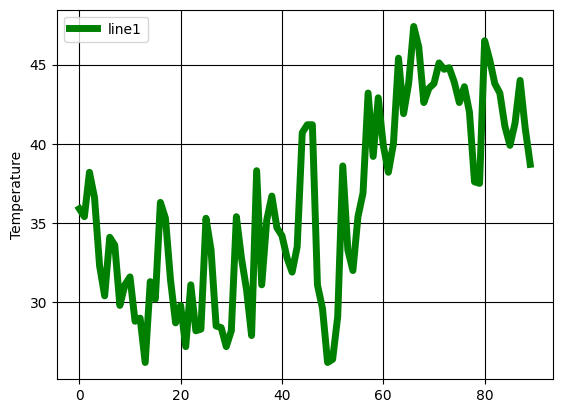

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ...........................alpha=0.7000000000000001; total time=   0.0s
[CV] END ...........................alpha=0.70000

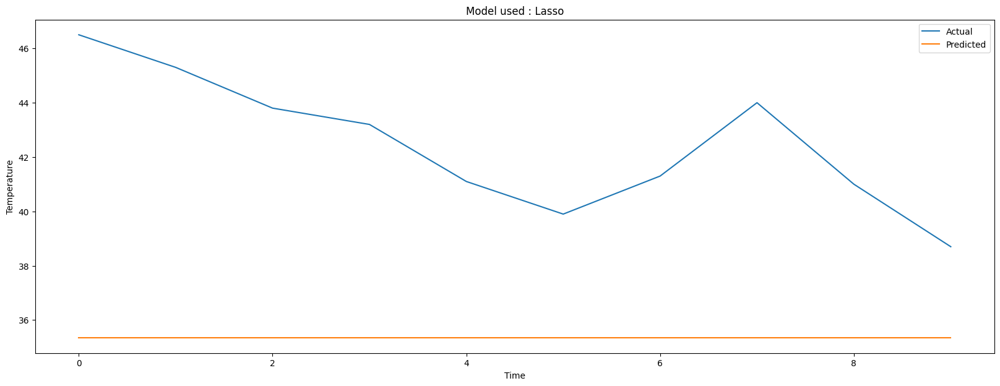

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

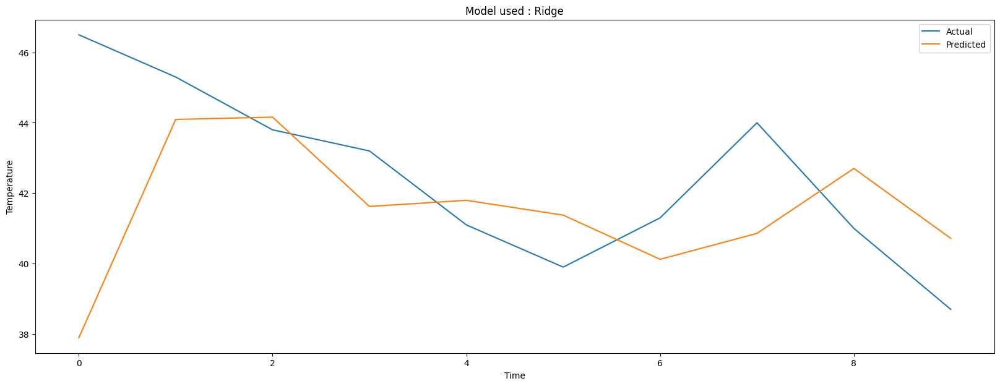

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

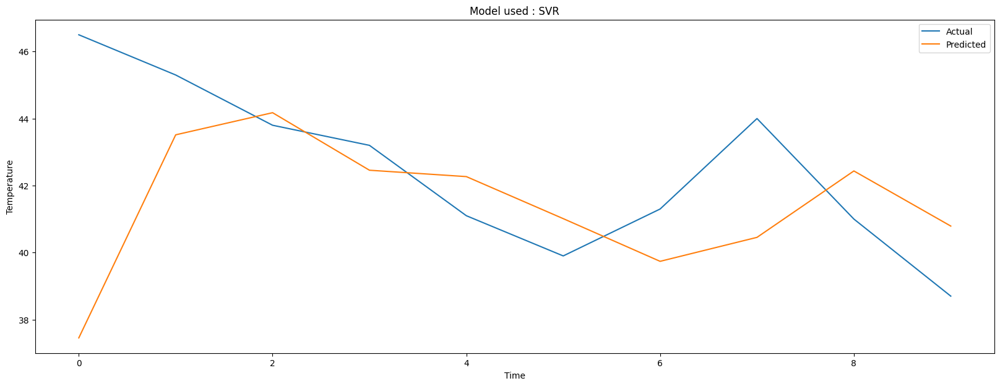

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392


{'Lasso': {'Best parameters': {'alpha': 0.1},
  'Validation MSE': 36.10870182668745,
  'Test MSE': 56.44432122967248},
 'Ridge': {'Best parameters': {'alpha': 0.01},
  'Validation MSE': 7.333427871204112,
  'Test MSE': 9.909372821681703},
 'SVR': {'Best parameters': {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'},
  'Validation MSE': 6.467309451130664,
  'Test MSE': 10.97674595844392}}

In [162]:
rey=IS507ForecastModels(df_rey,5,models,param_grids,True,True)
rey.train()

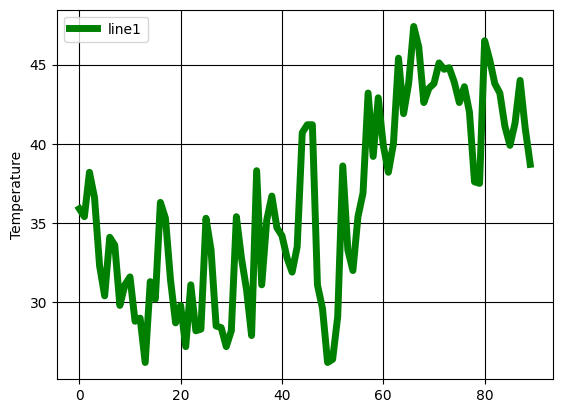

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ...........................alpha=0.7000000000000001; total time=   0.0s
[CV] END ...........................alpha=0.70000

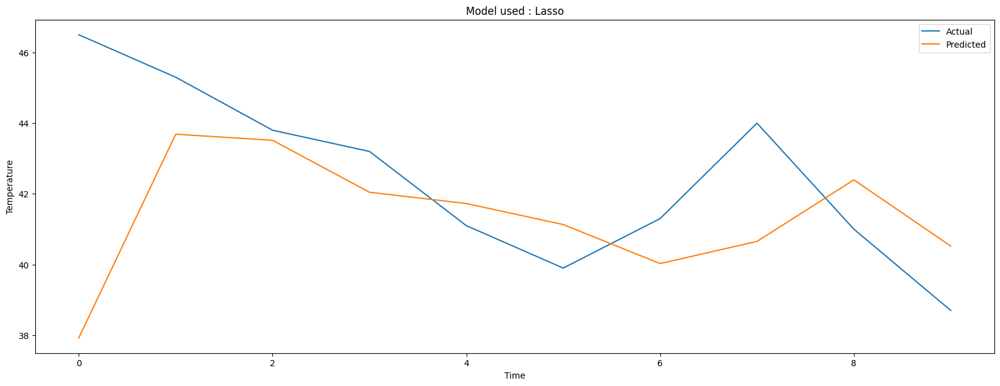

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

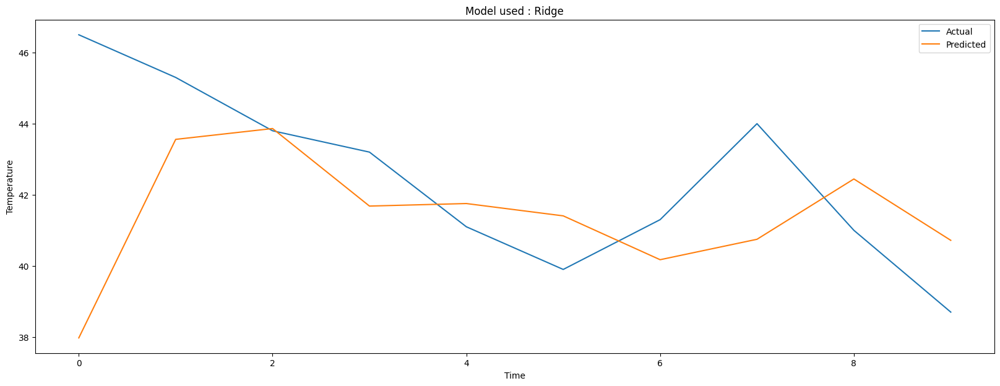

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

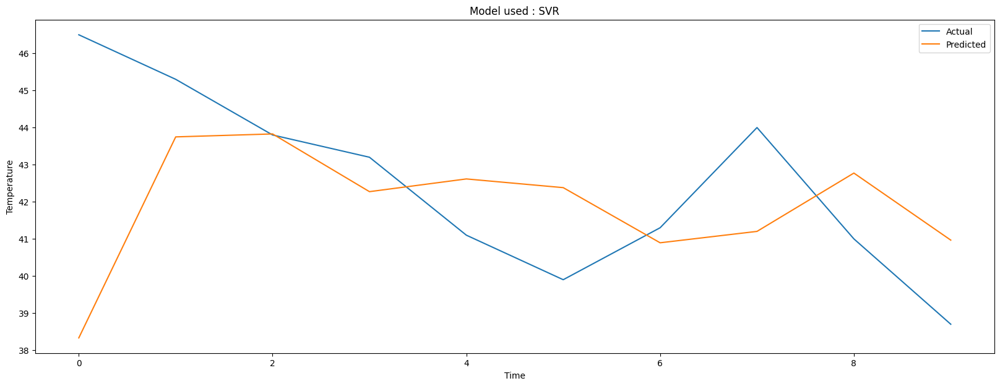

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146


In [137]:
rey=IS507ForecastModels(df_rey,5,models,param_grids,True,False)
rey.train()

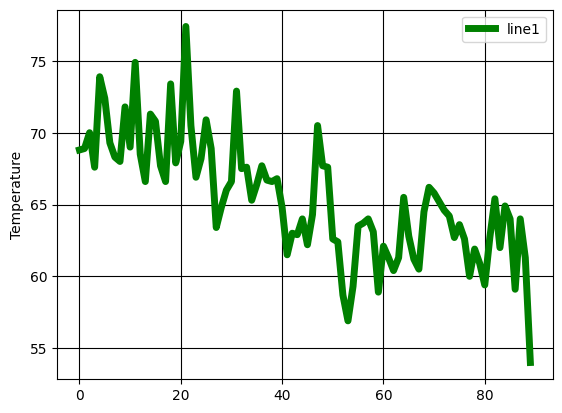

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ...........................alpha=0.7000000000000001; total time=   0.0s
[CV] END ...........................alpha=0.70000

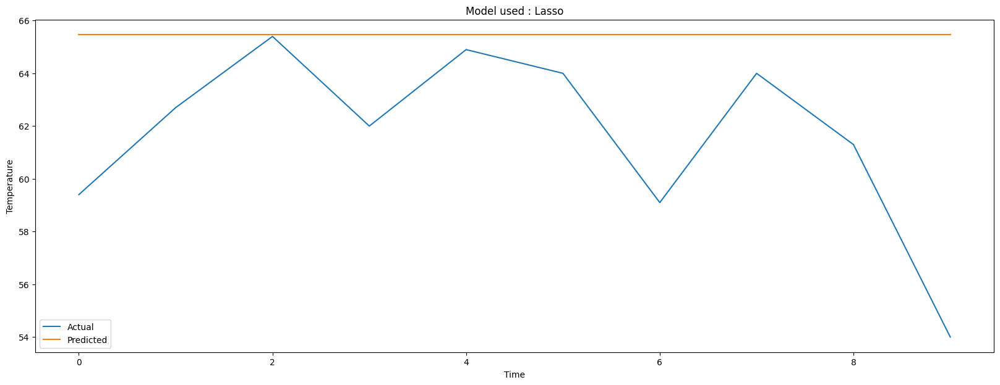

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

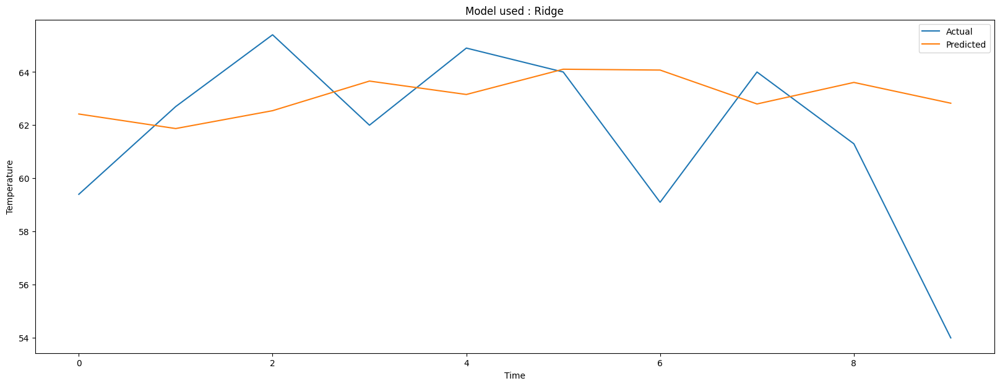

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

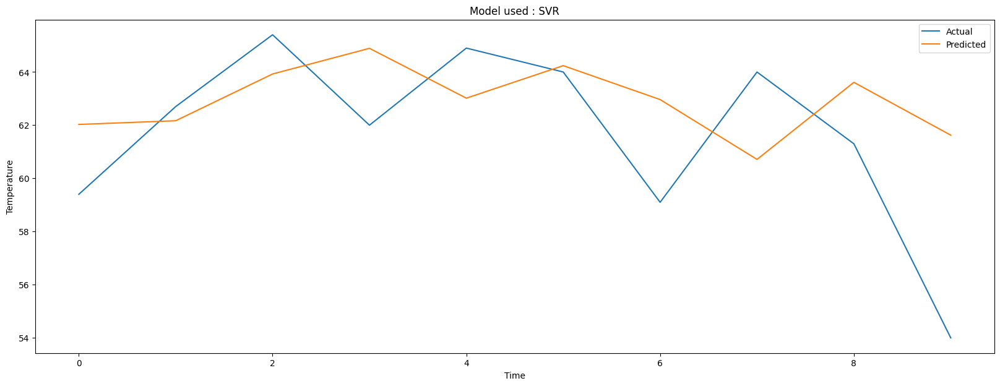

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156


In [138]:
cap=IS507ForecastModels(df_cap,5,models,param_grids,True,True)
cap.train()

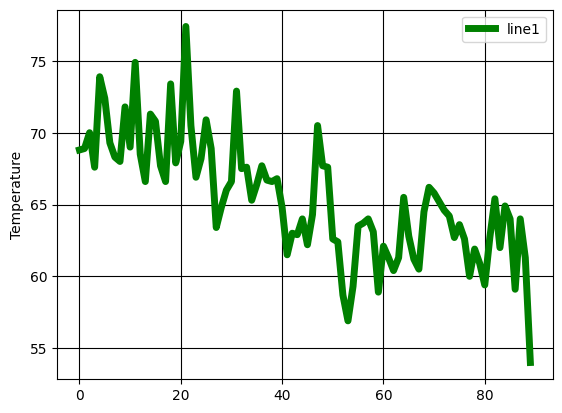

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ...........................alpha=0.7000000000000001; total time=   0.0s
[CV] END ...........................alpha=0.70000

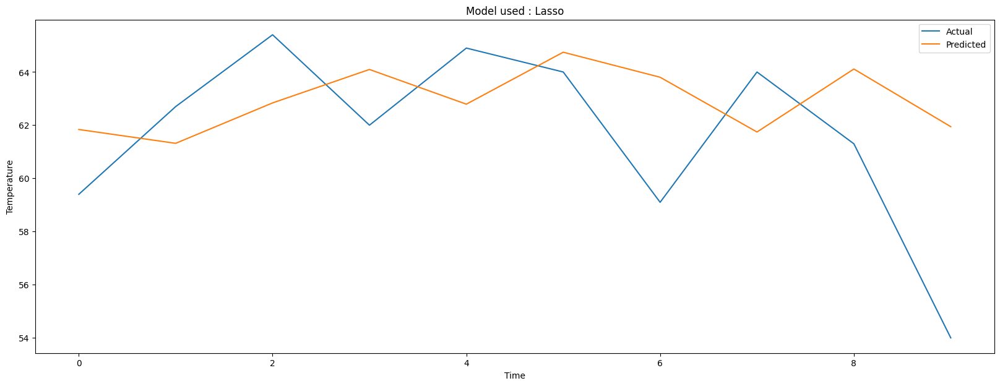

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

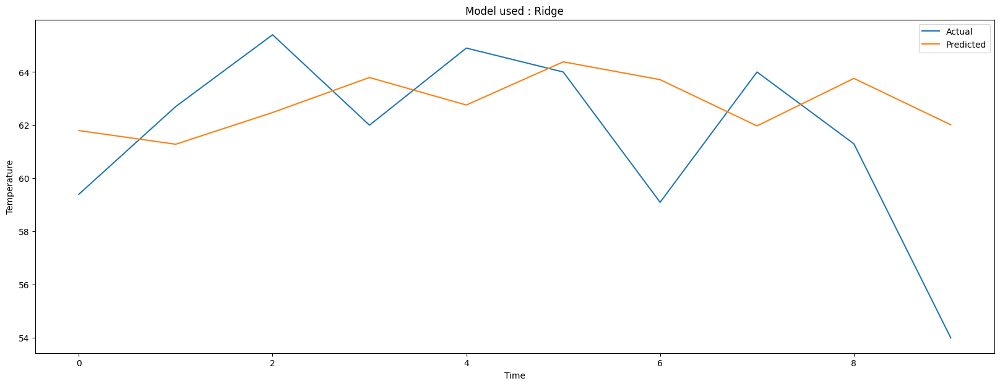

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

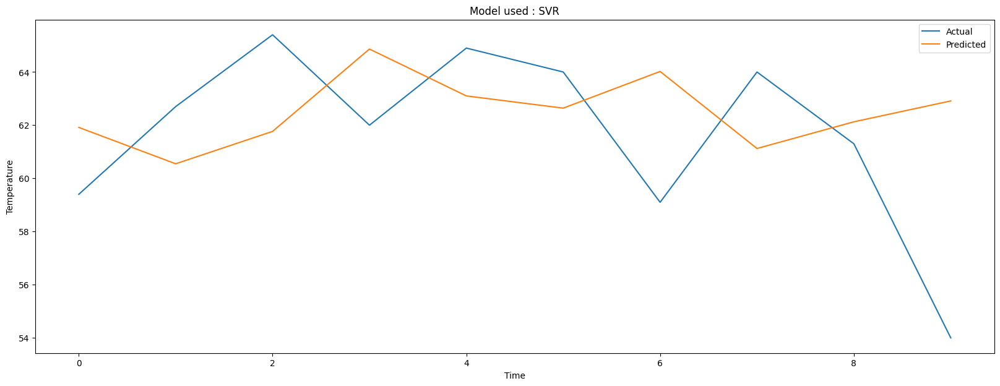

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433


In [139]:
cap=IS507ForecastModels(df_cap,5,models,param_grids,True,False)
cap.train()

In [ ]:
"""
REY --> CITY
Standardized True

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392

Standardized False

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146



CAPETOWN --> CITY

Standardized True

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156

Standardized False
Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
"""

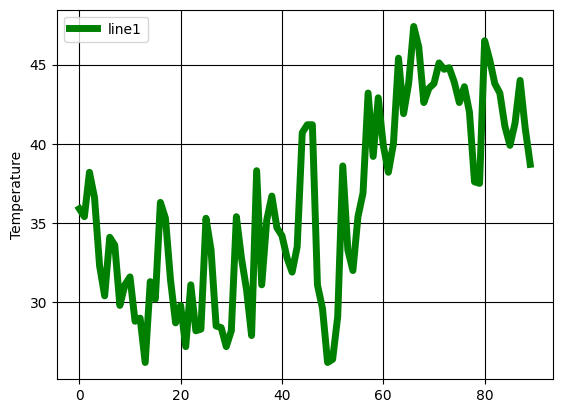

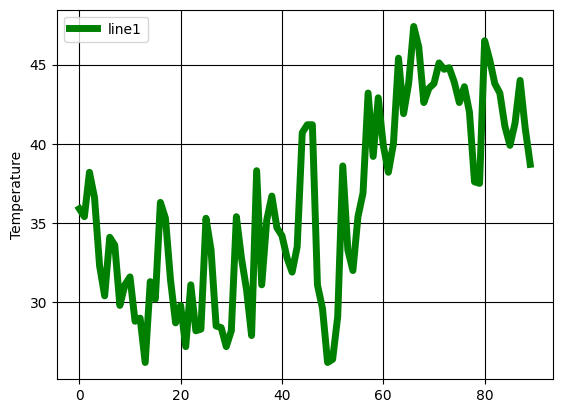

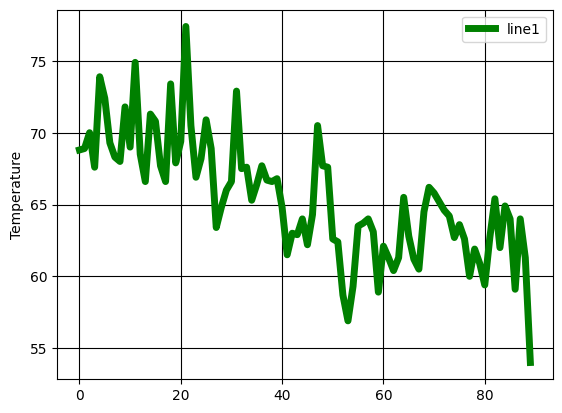

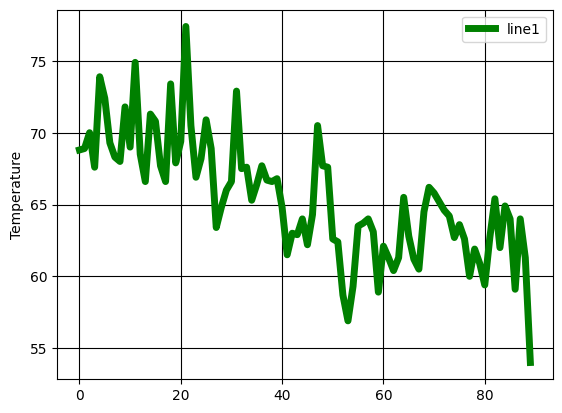

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ...........................alpha=0.7000000000000001; total time=   0.0s
[CV] END ...........................alpha=0.70000

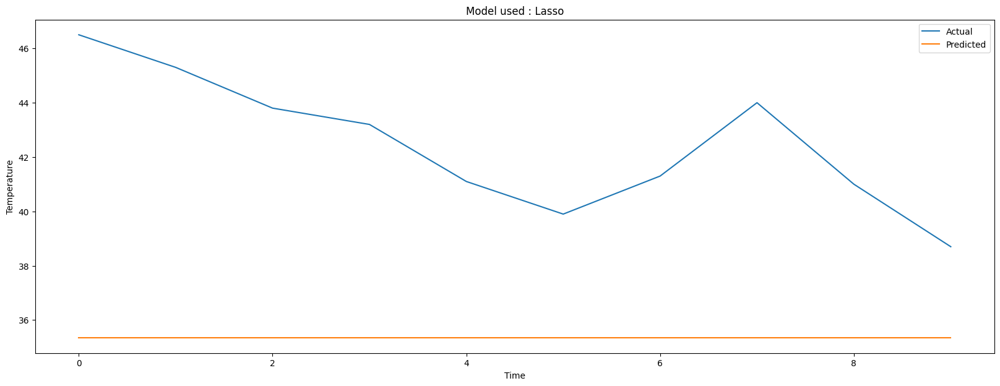

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

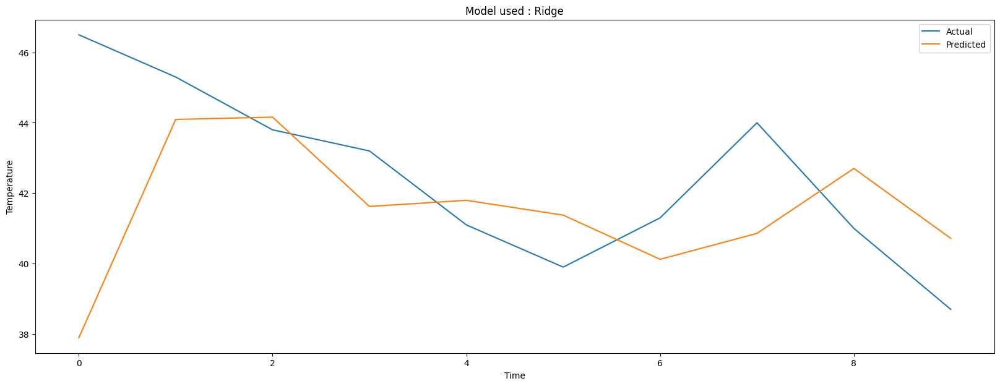

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

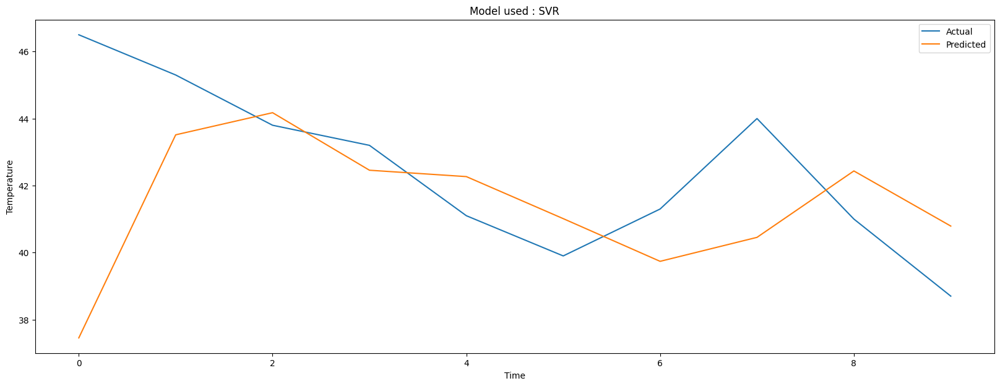

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

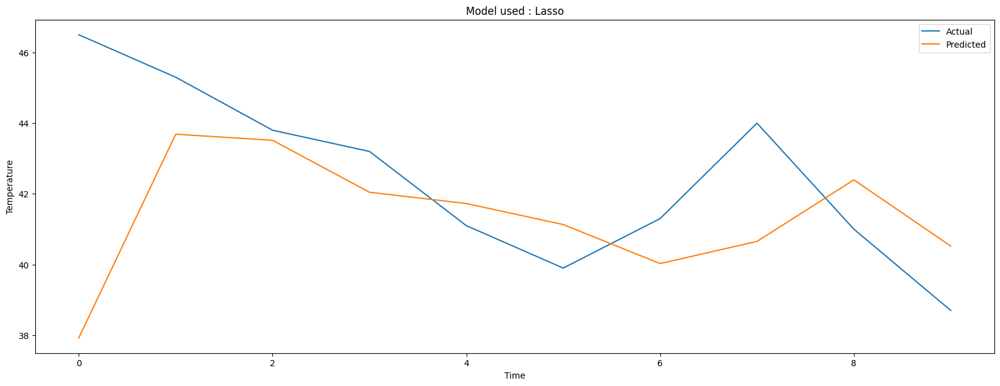

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

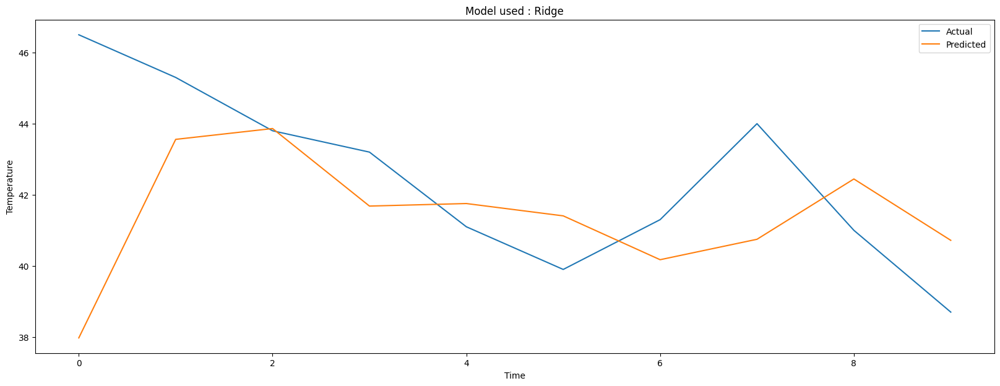

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

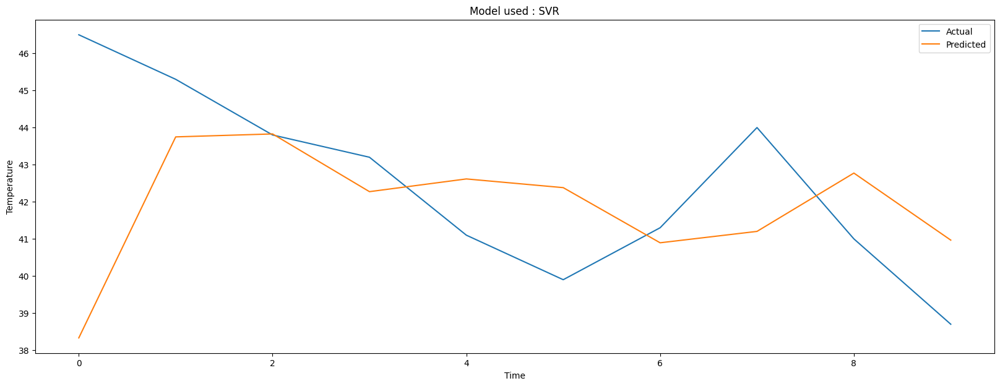

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

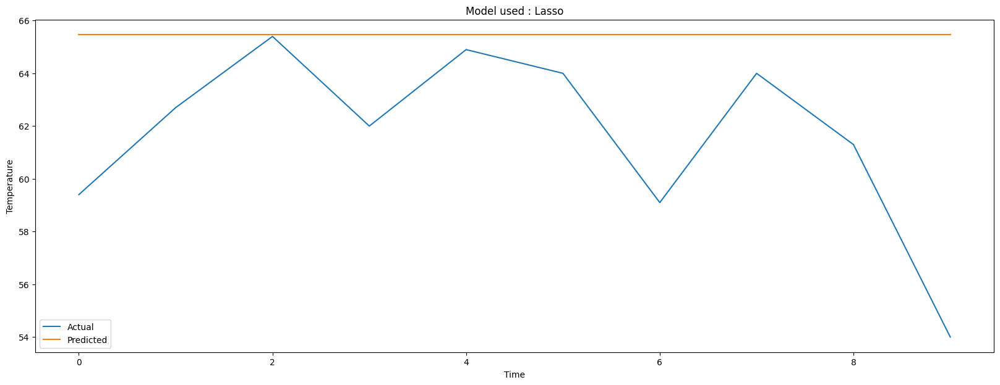

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

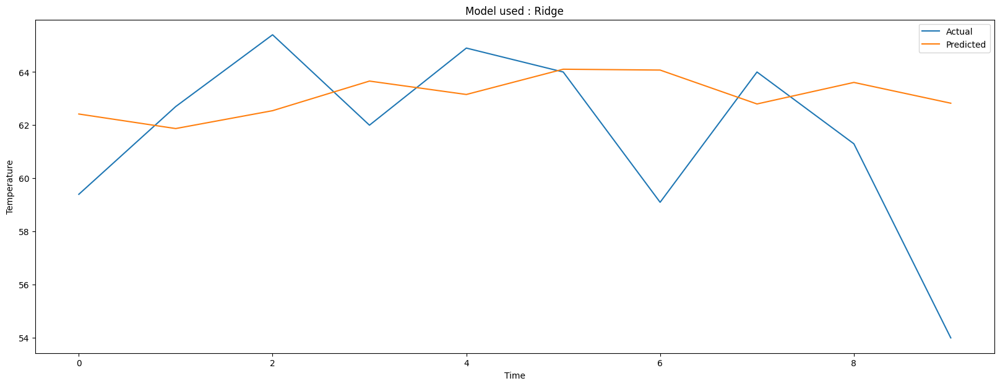

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

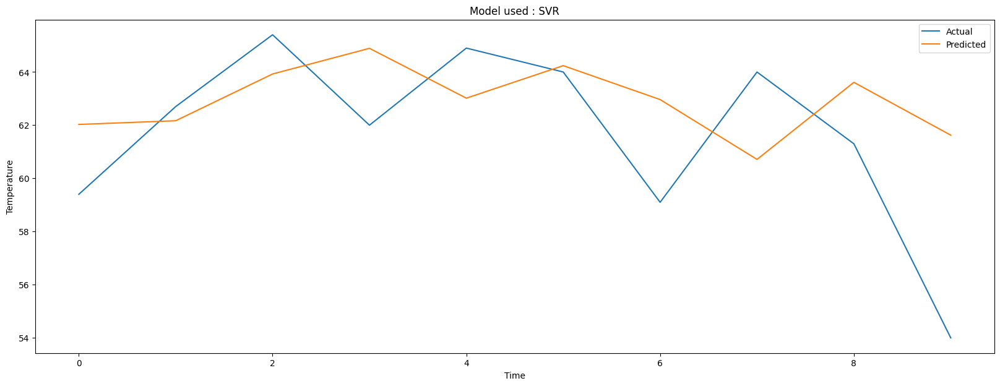

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

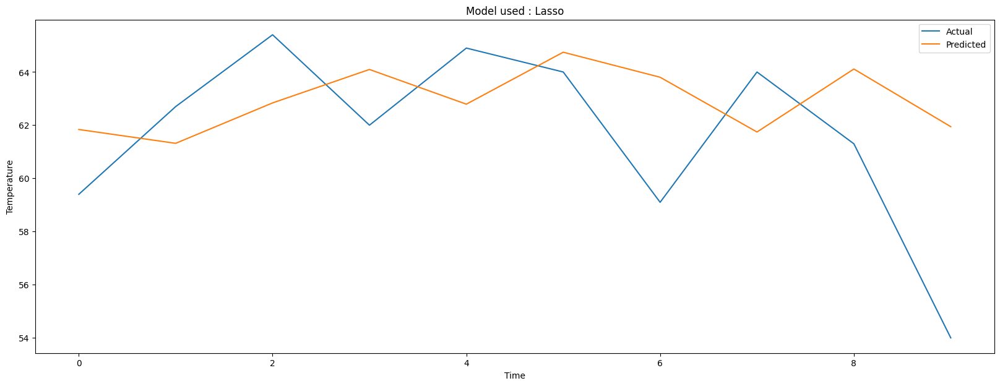

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

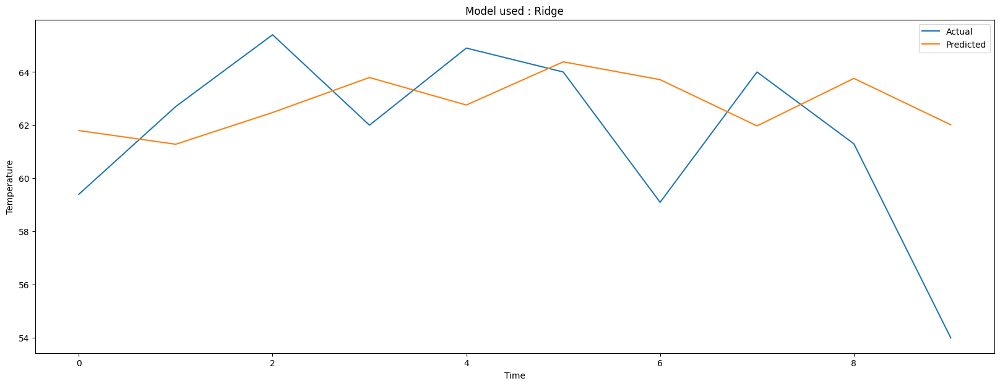

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

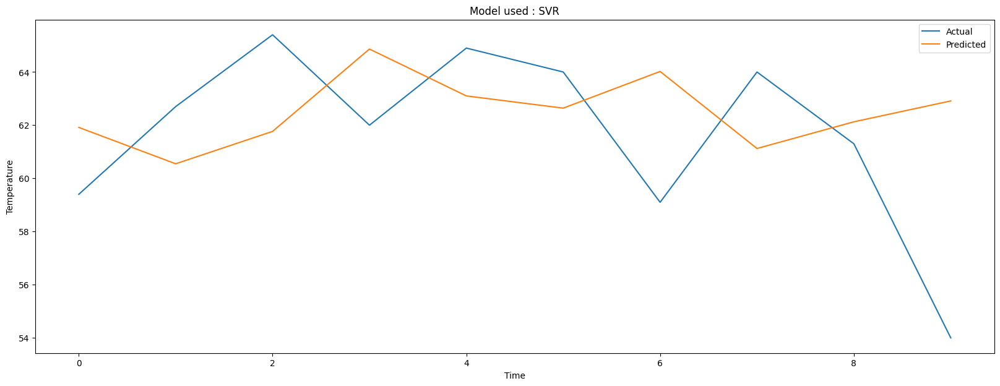

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

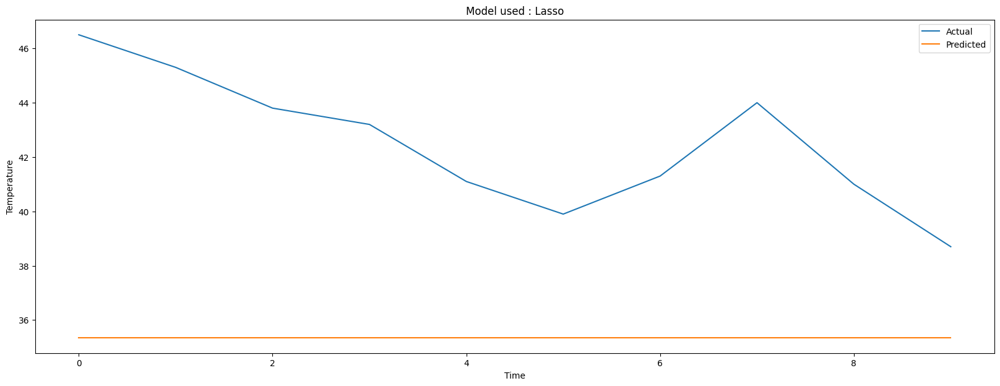

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

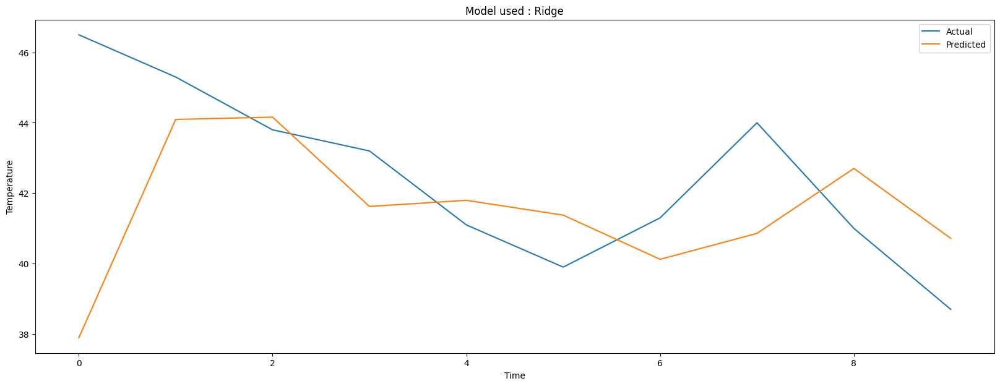

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

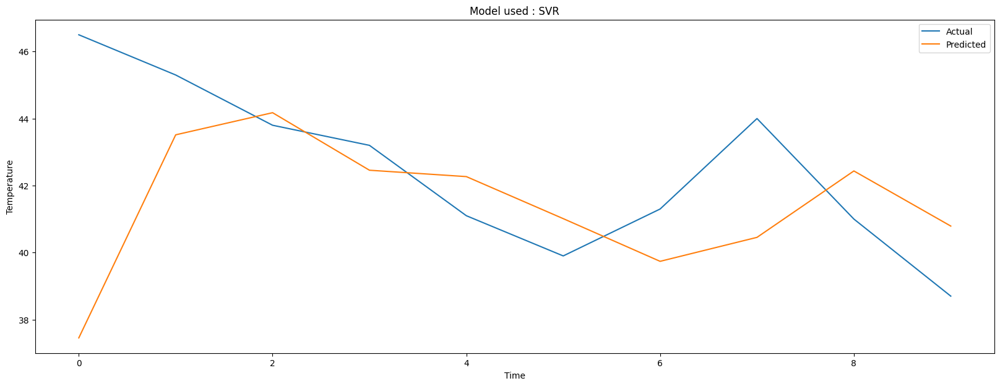

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

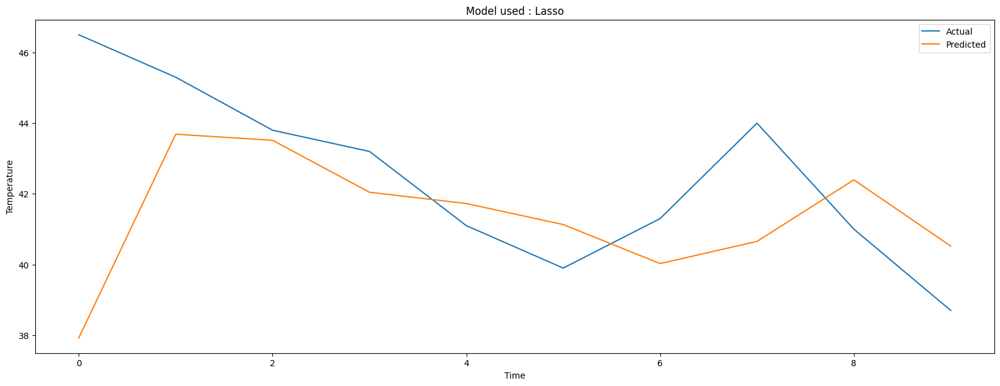

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

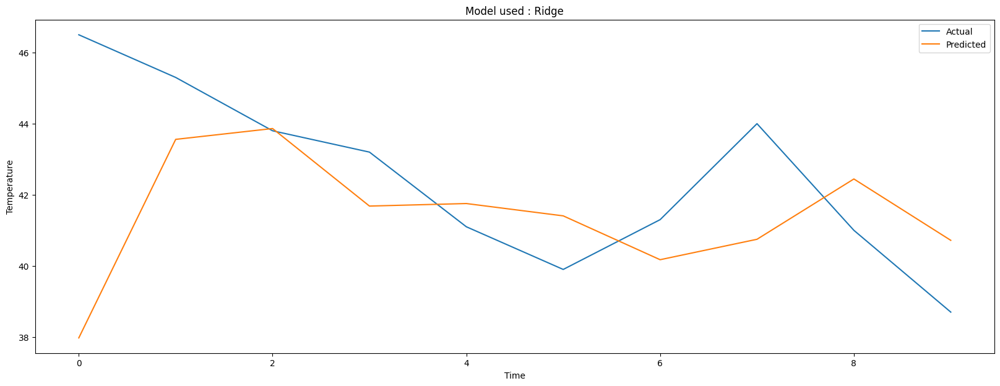

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

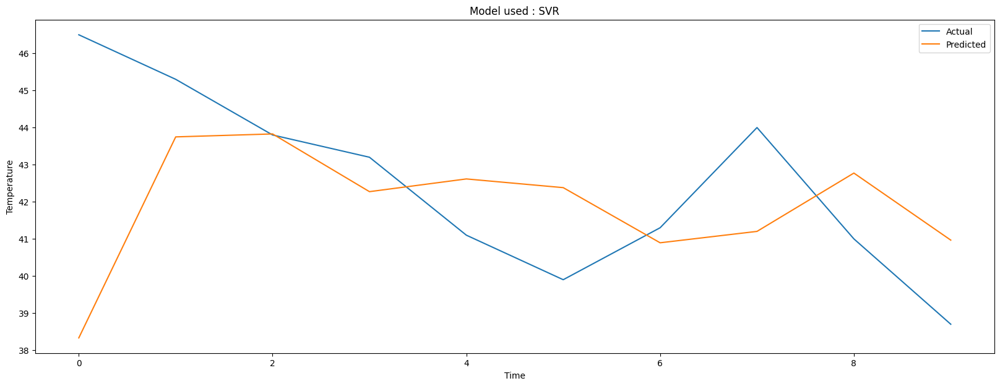

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

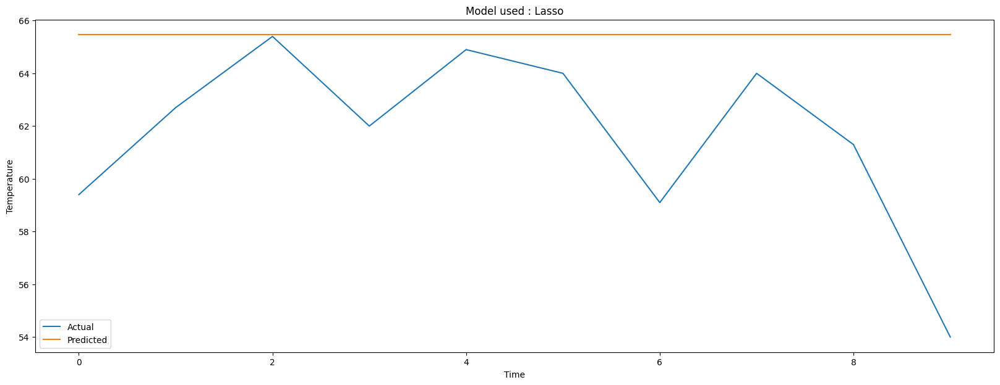

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

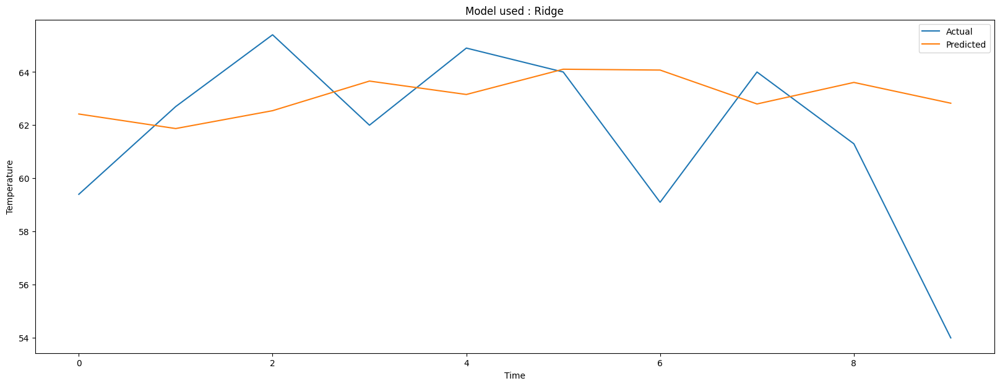

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

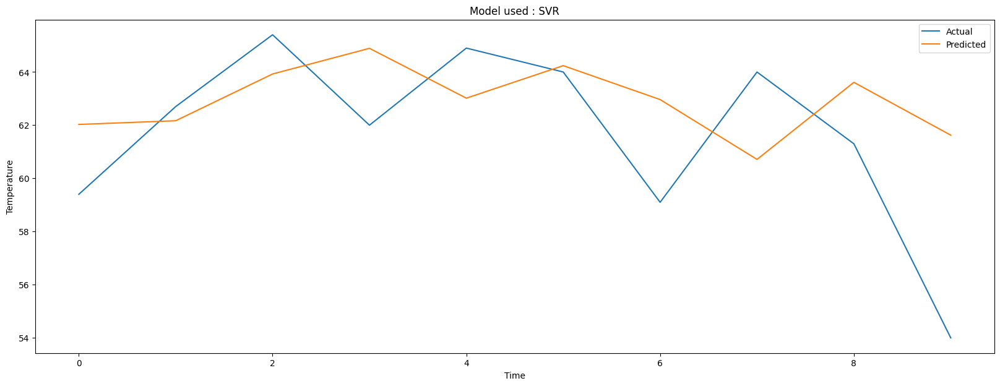

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

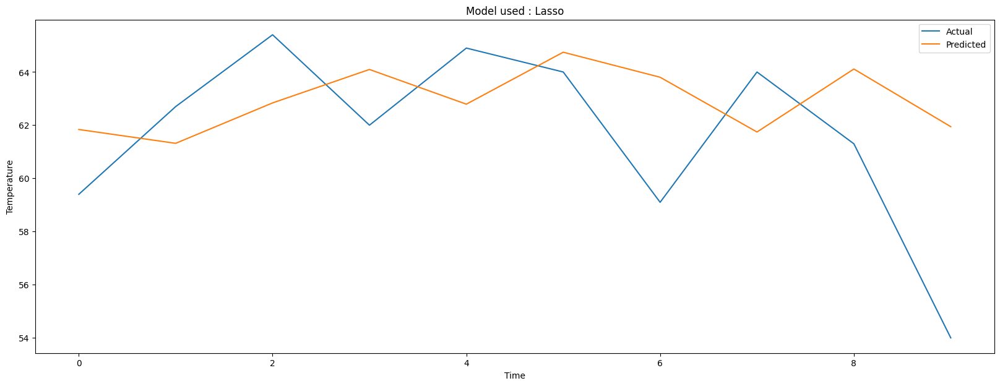

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

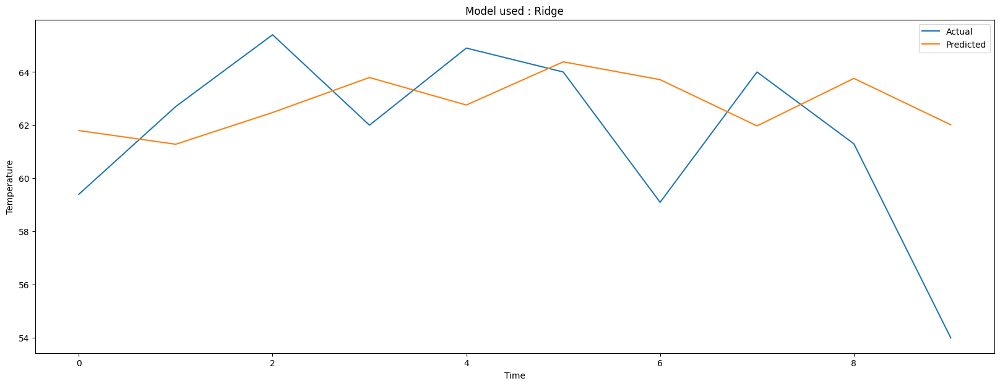

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

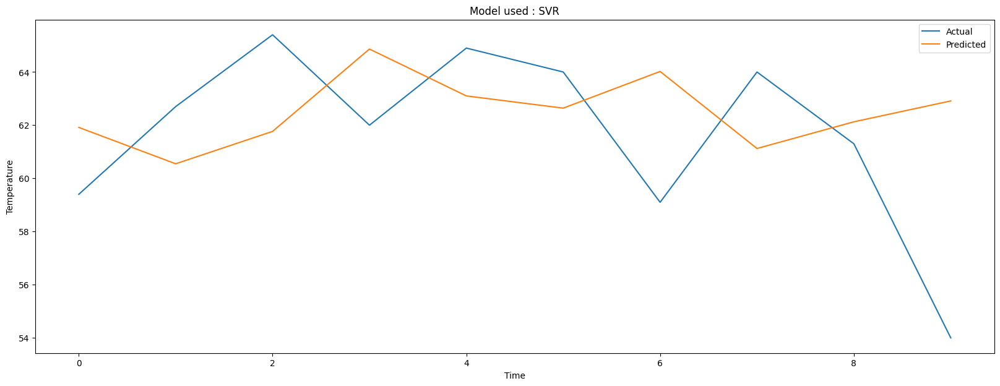

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

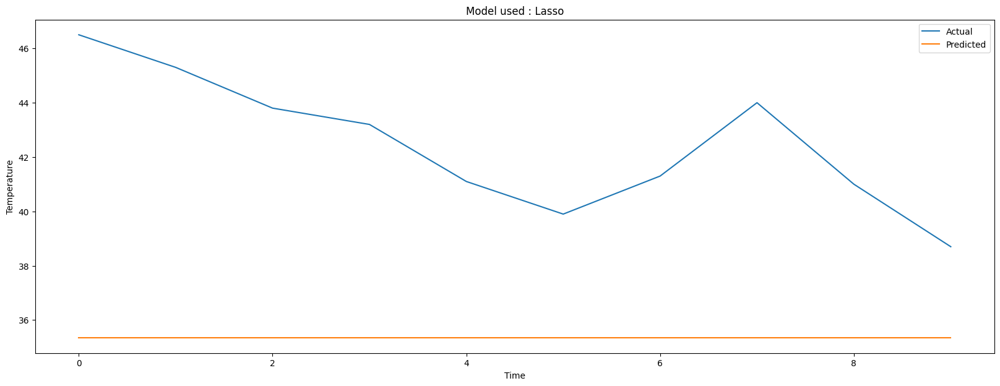

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

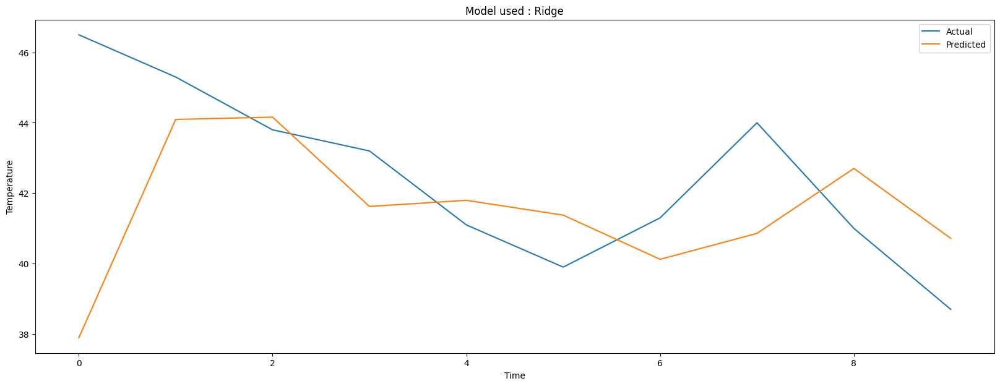

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

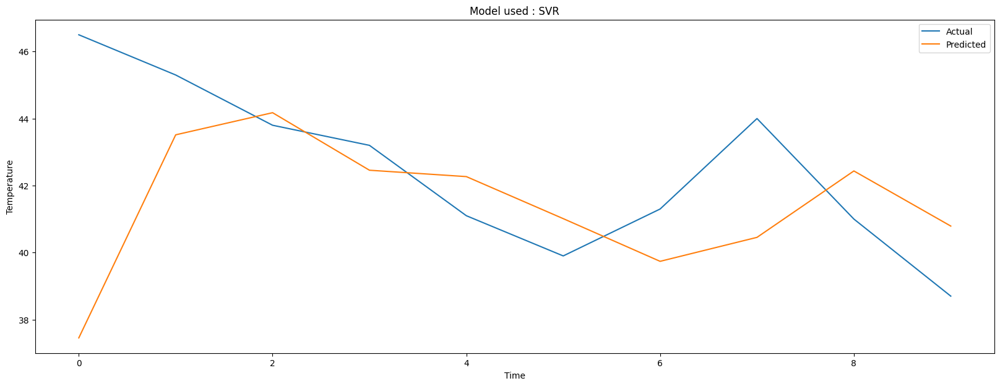

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

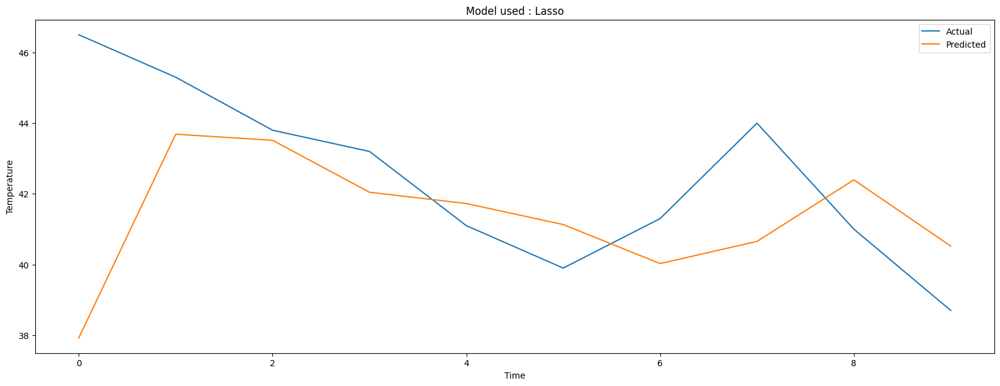

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

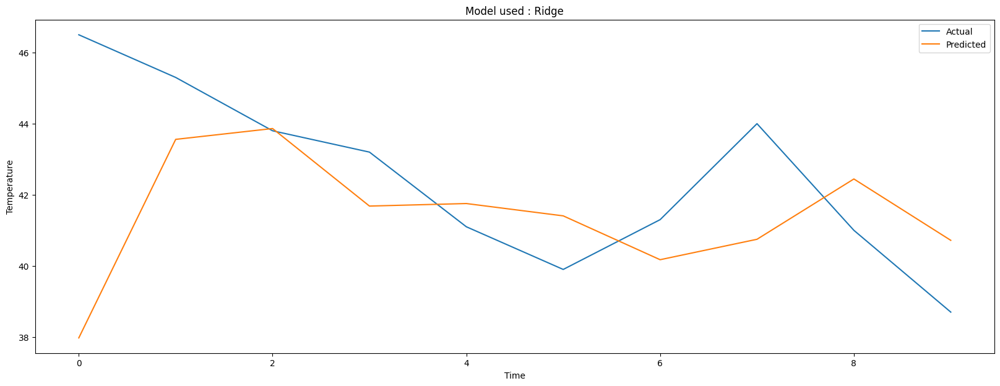

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

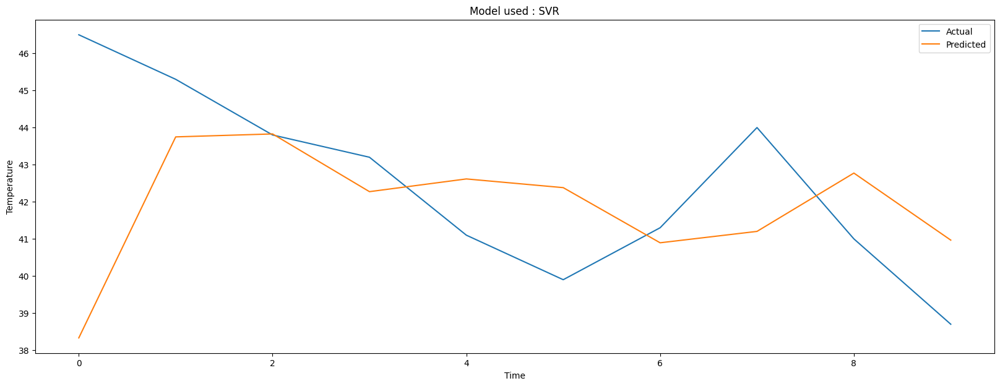

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

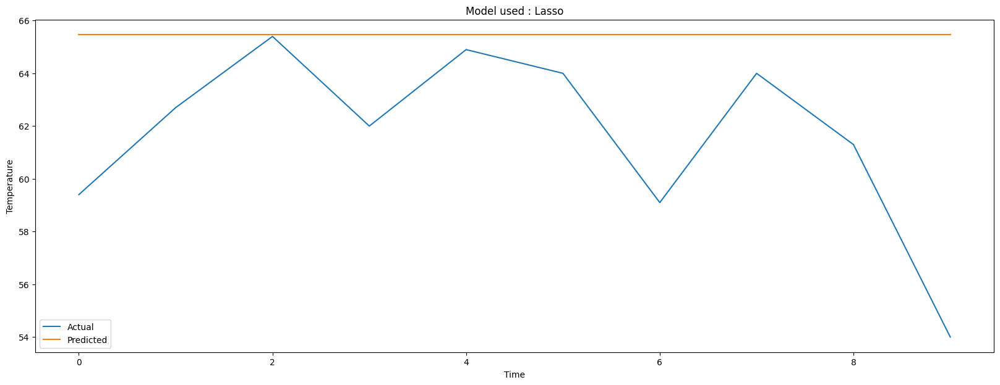

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

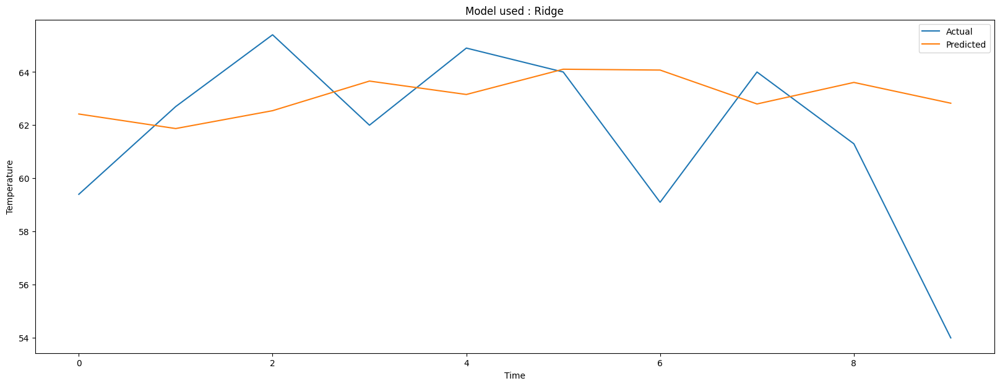

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

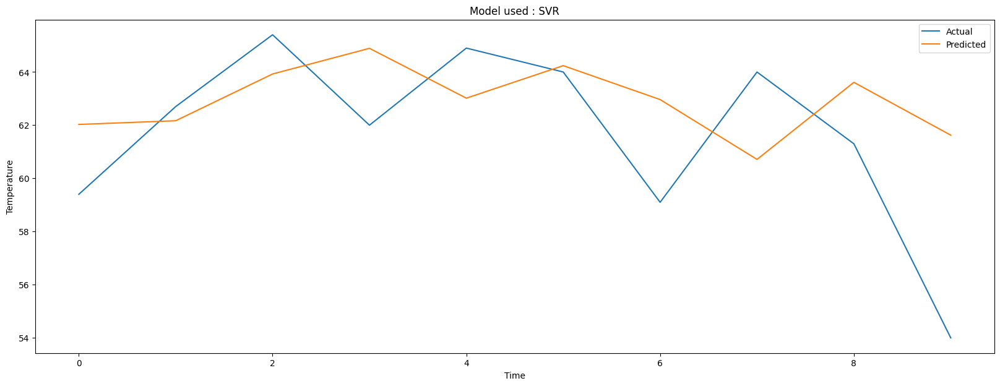

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

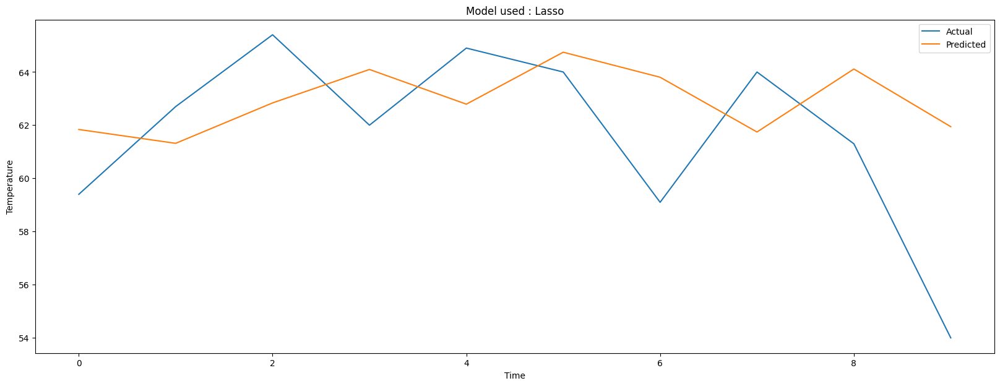

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

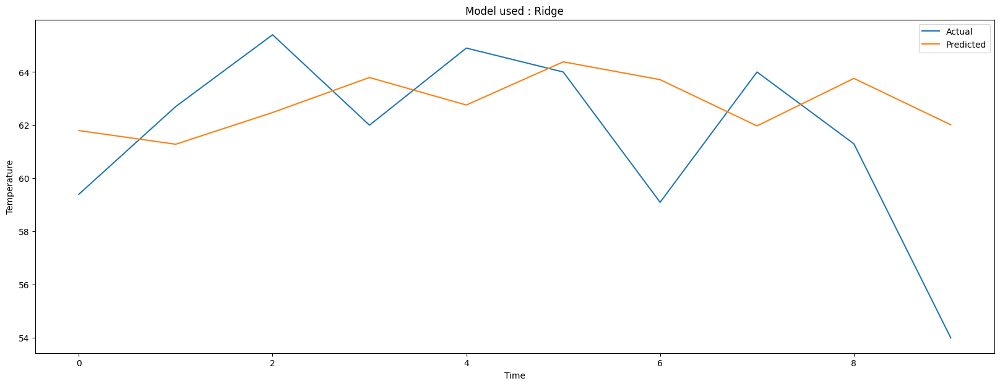

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

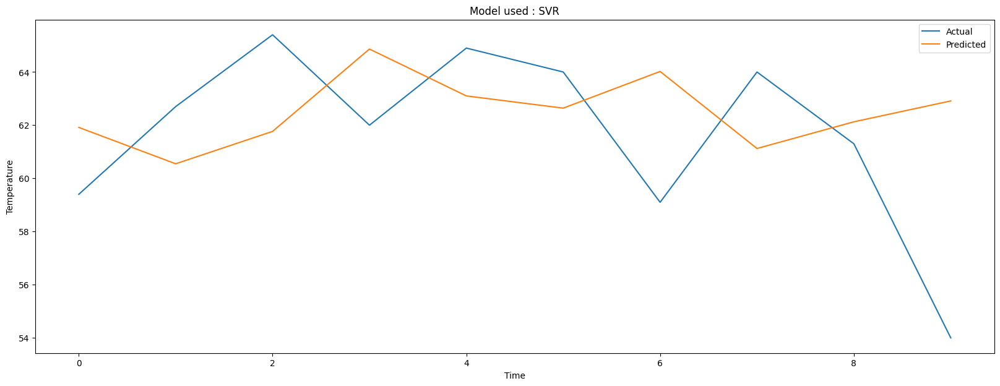

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

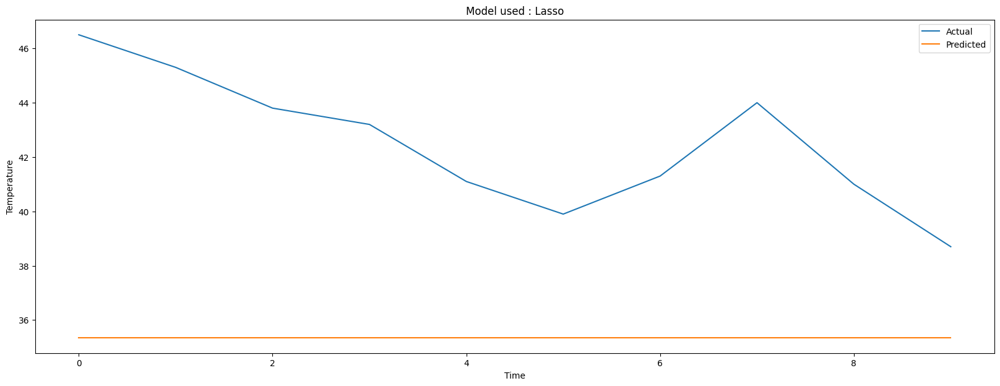

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

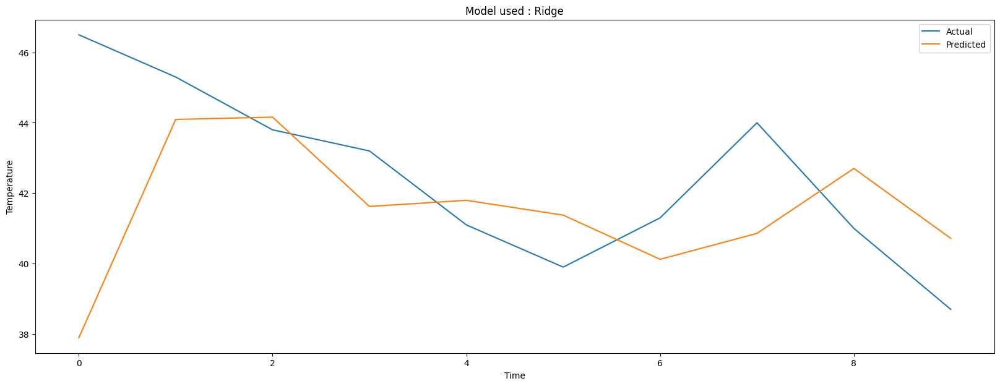

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

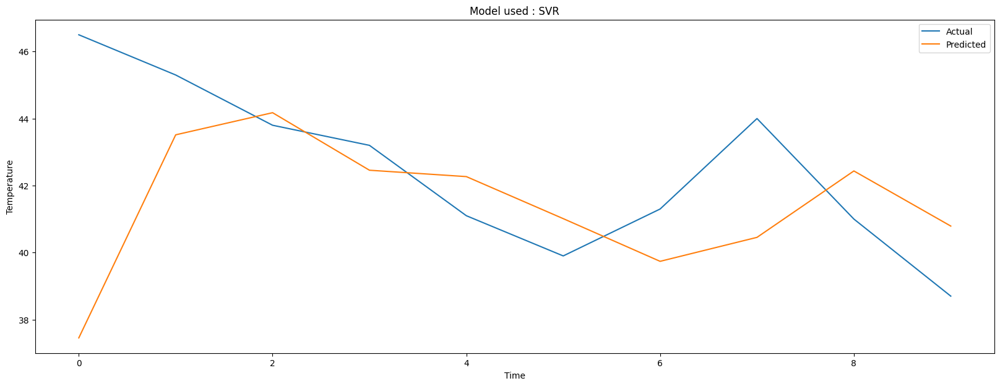

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

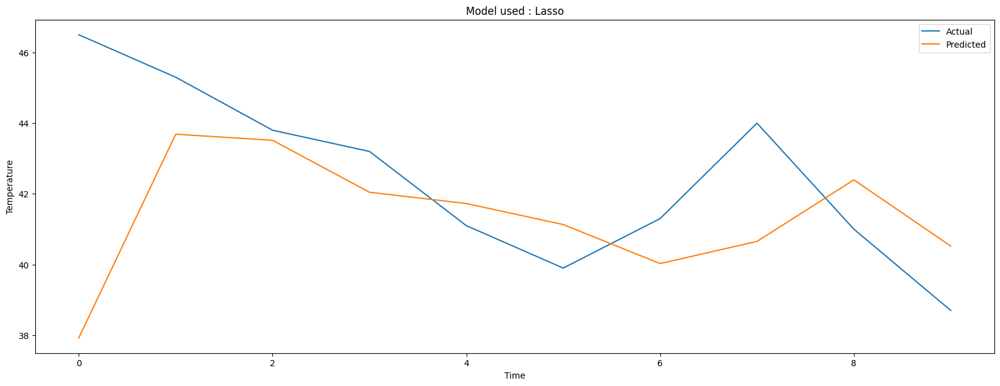

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

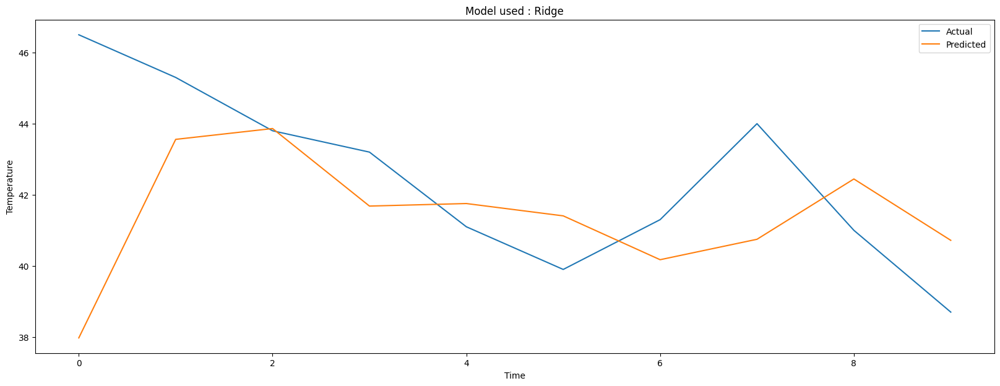

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

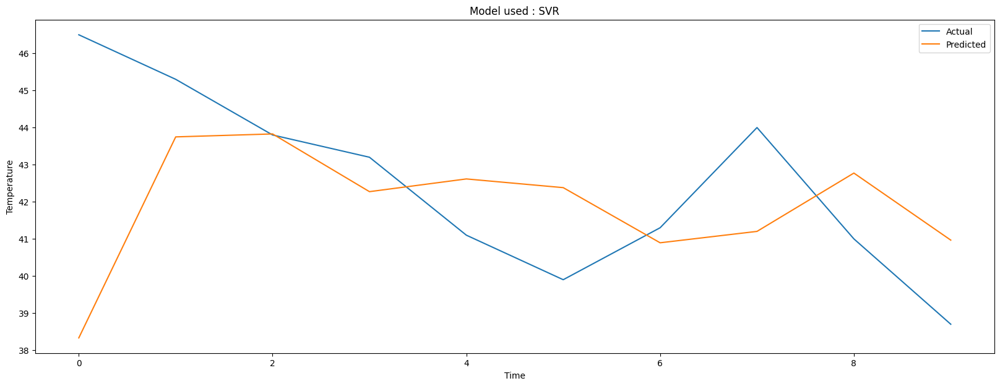

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

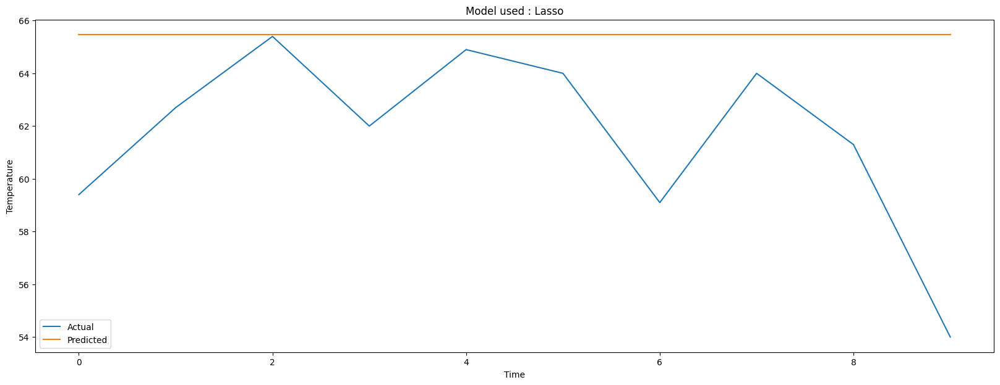

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

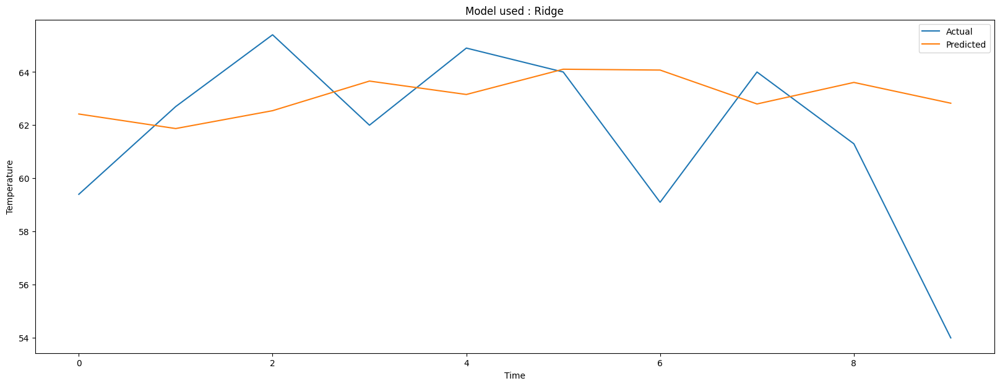

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

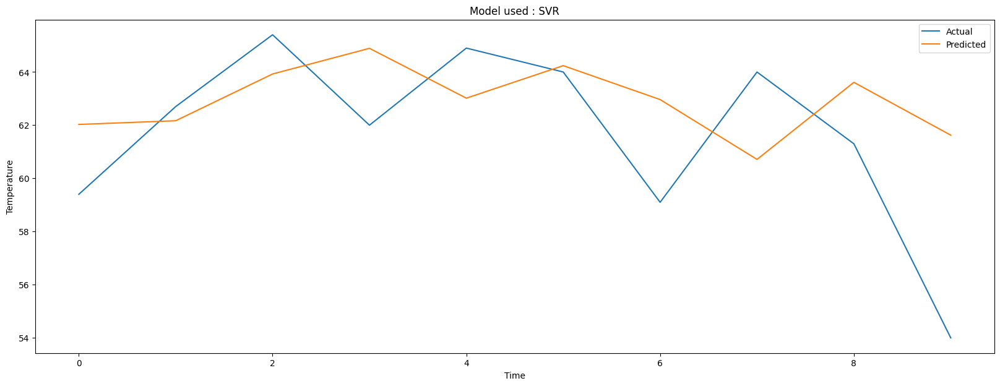

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

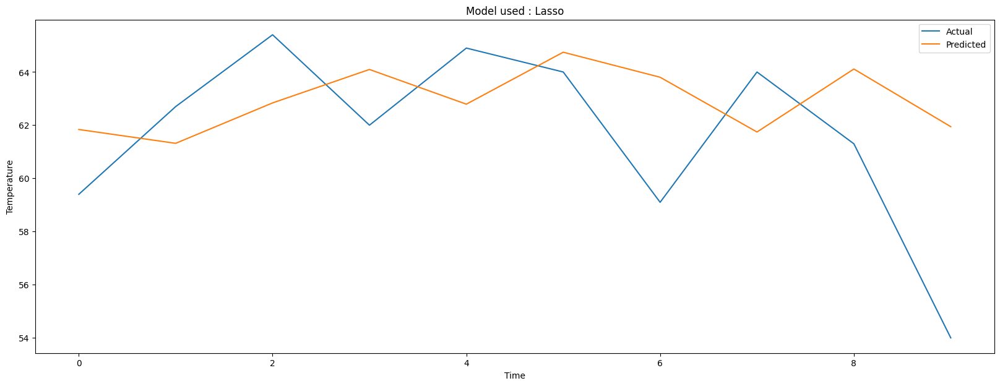

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

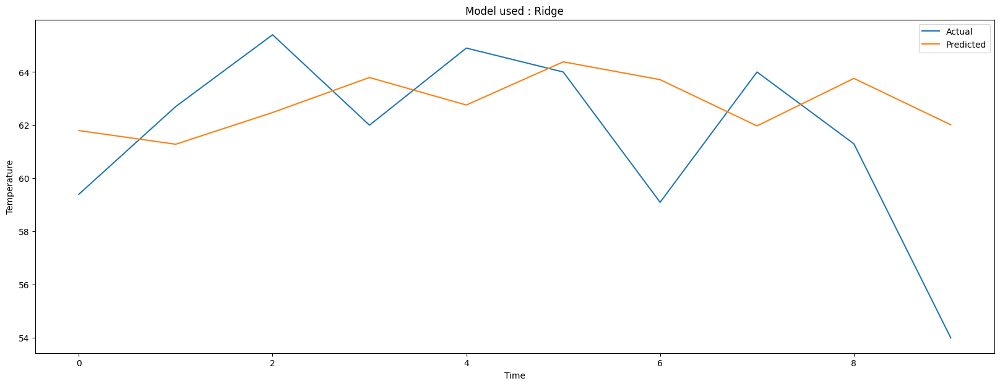

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

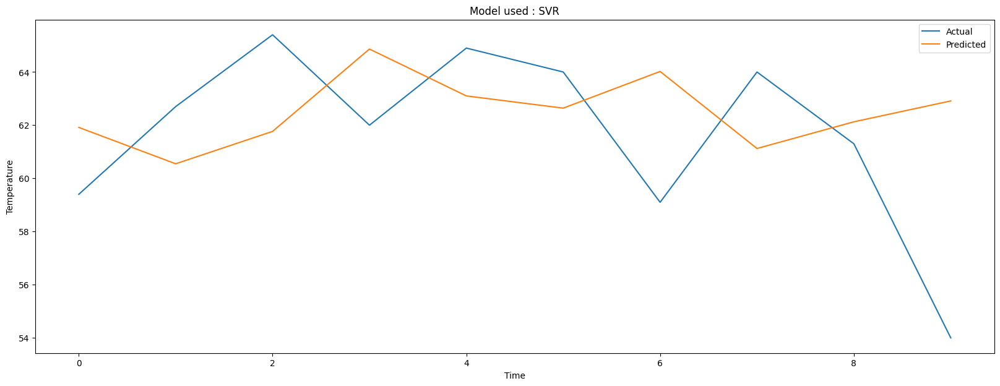

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

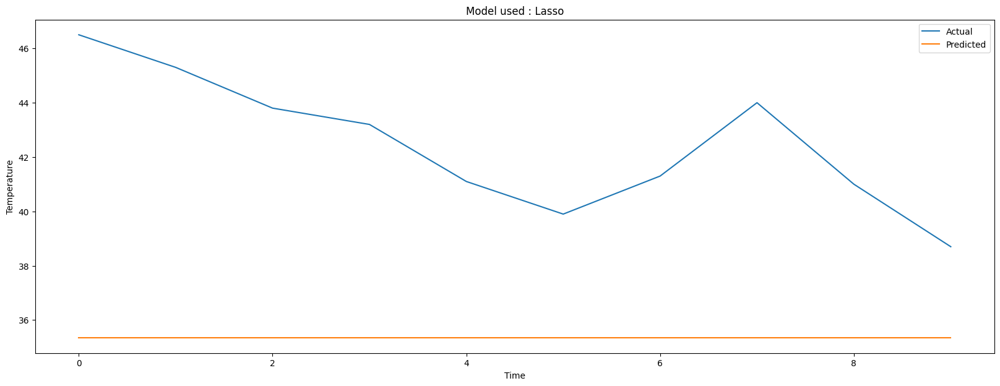

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

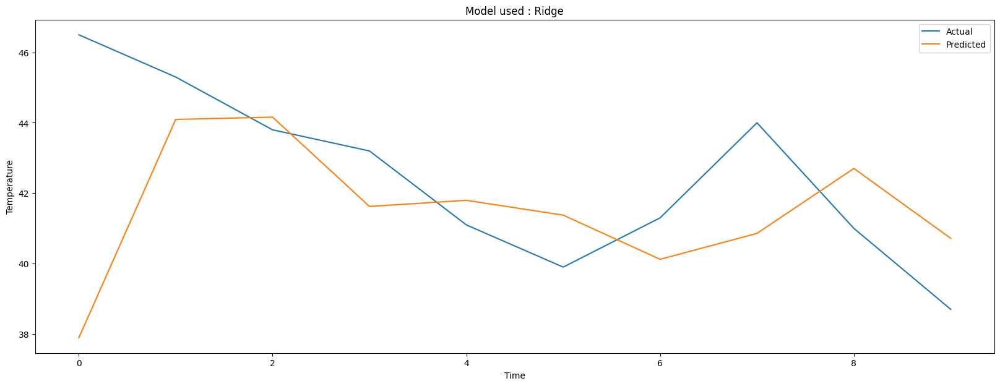

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

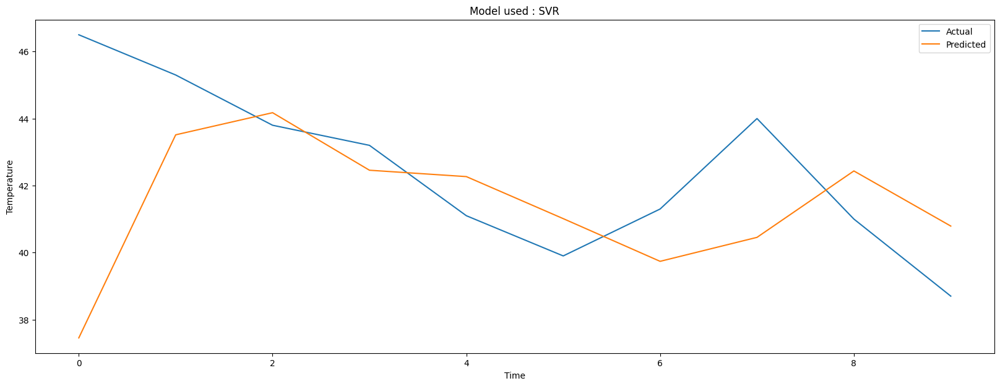

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

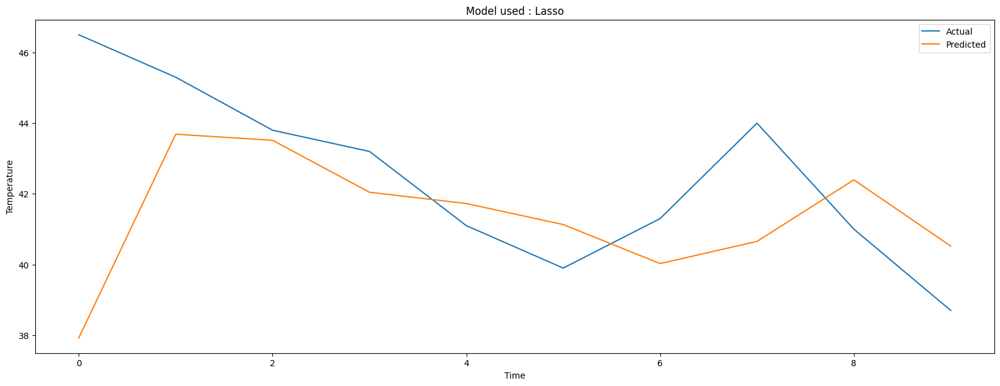

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

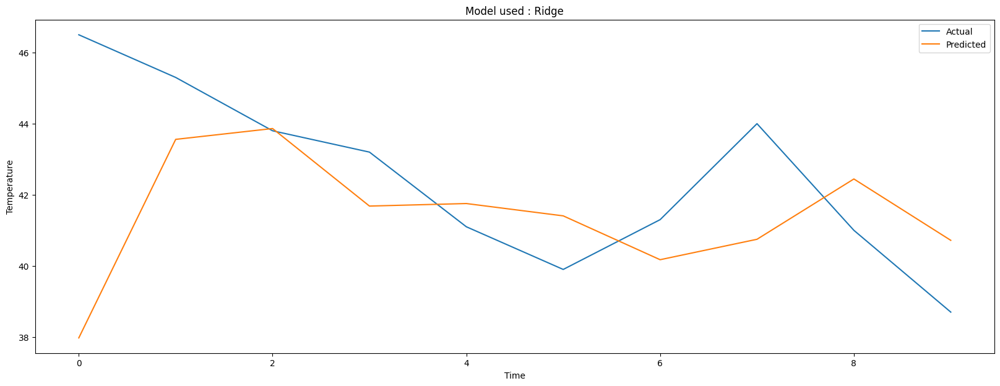

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

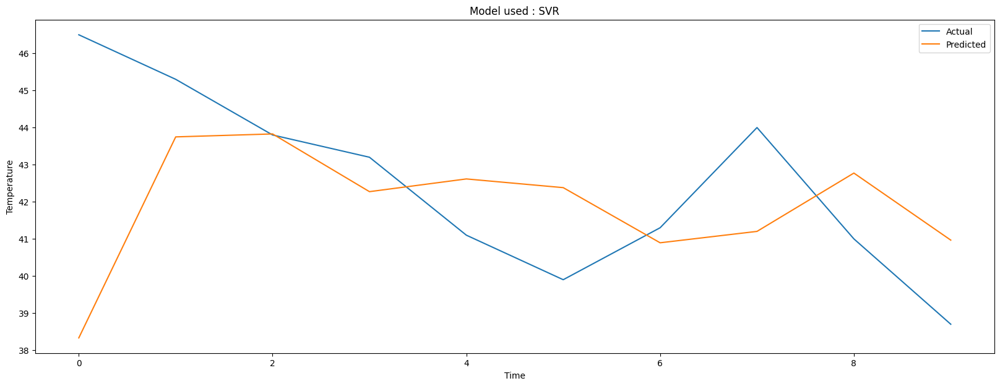

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

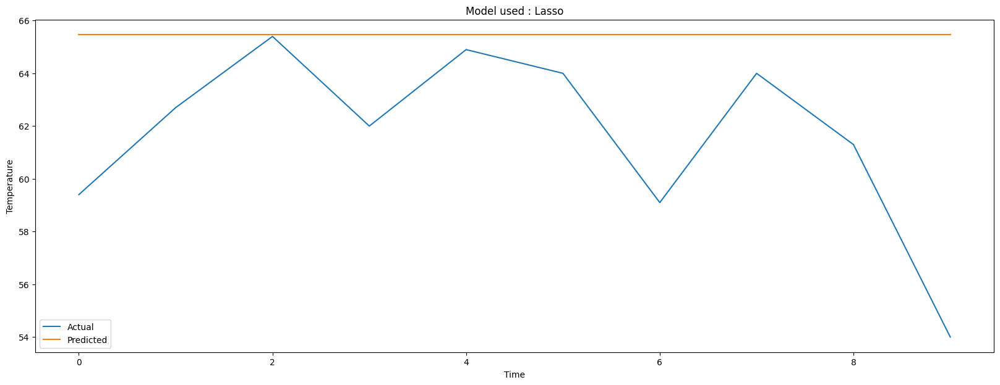

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

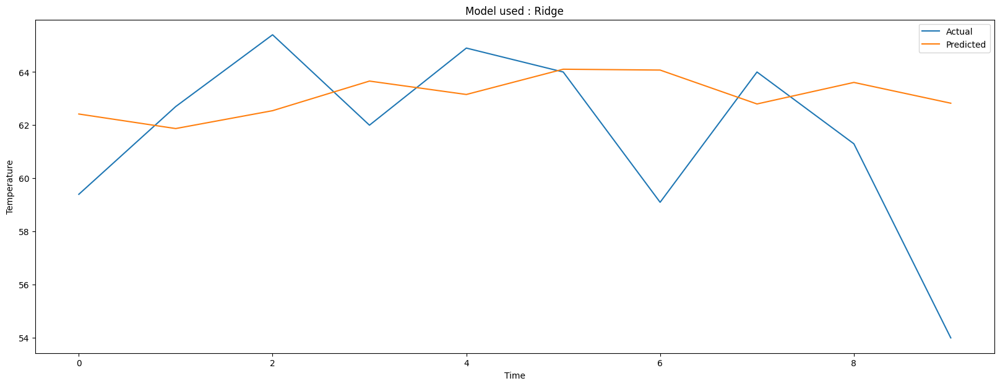

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

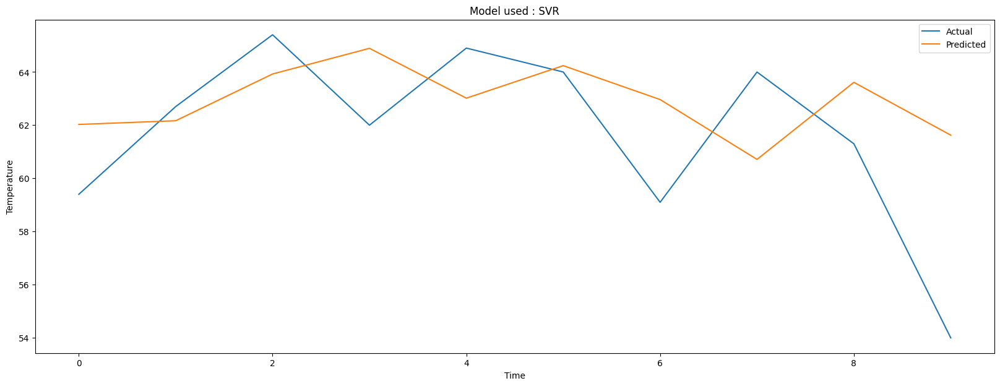

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

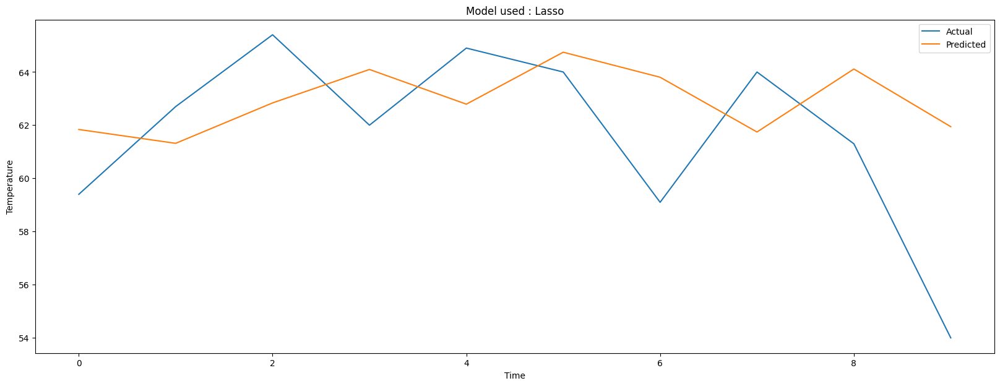

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

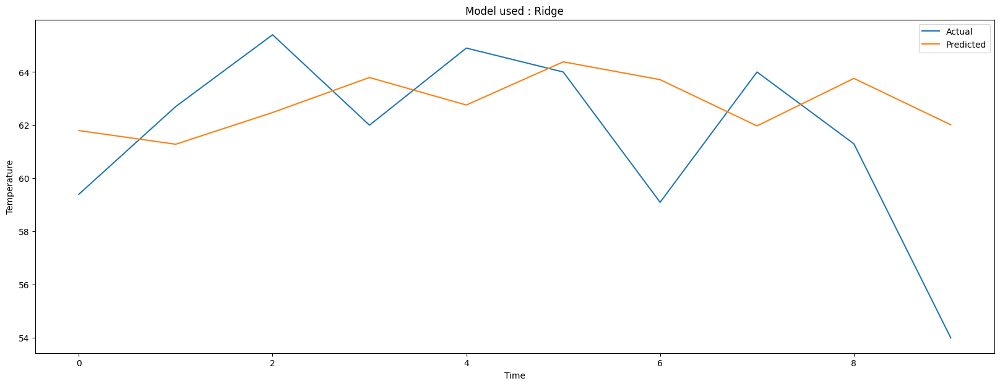

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

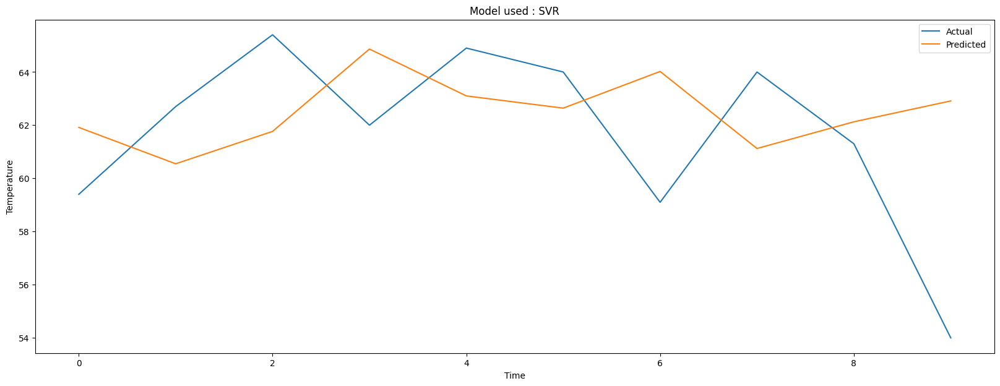

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

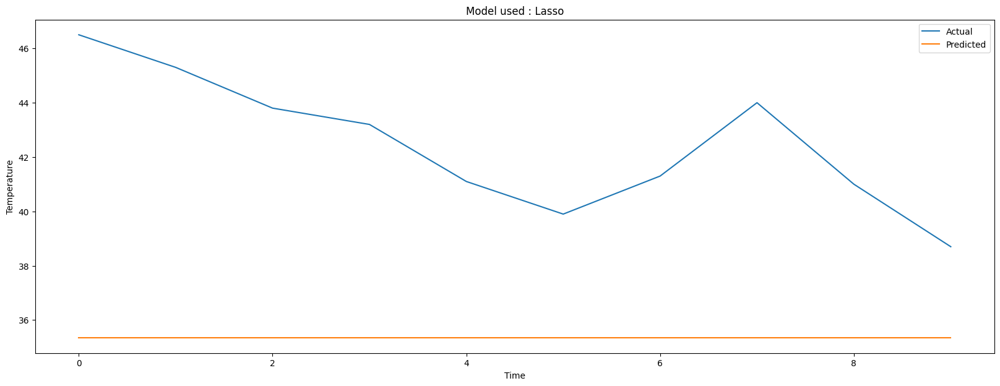

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

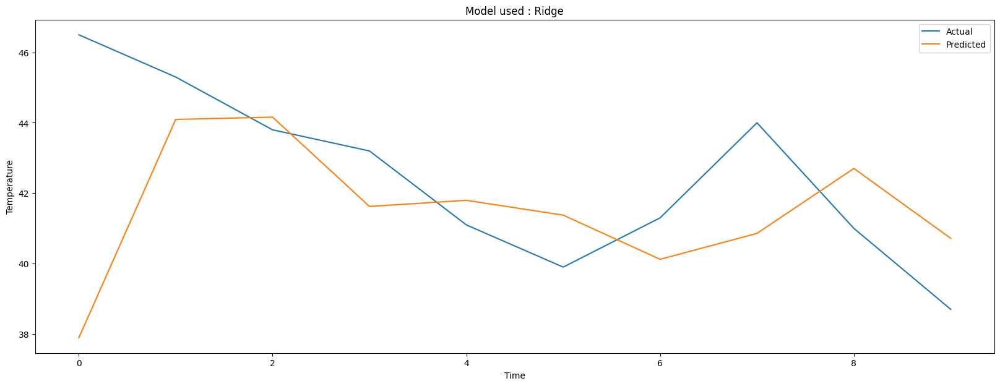

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

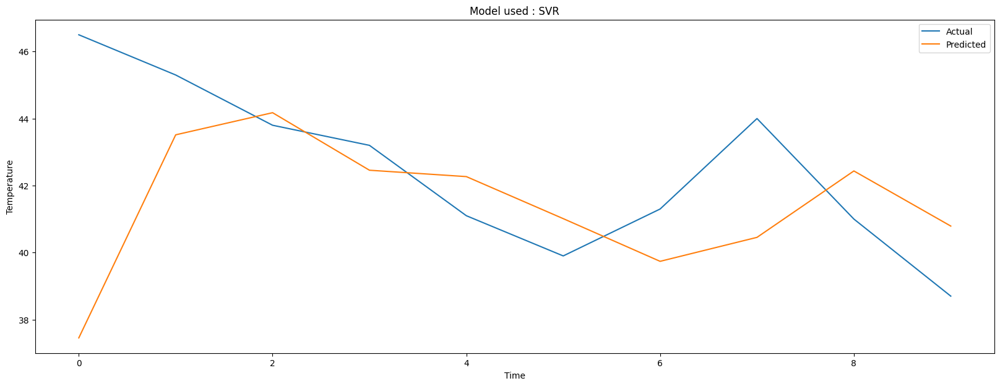

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

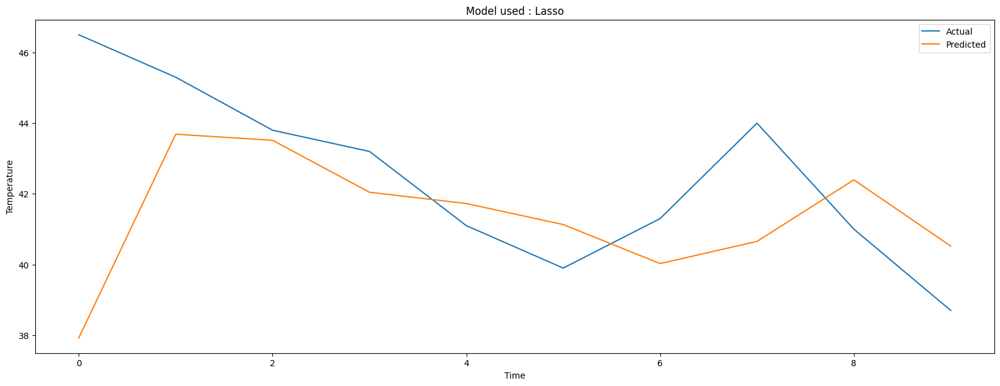

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

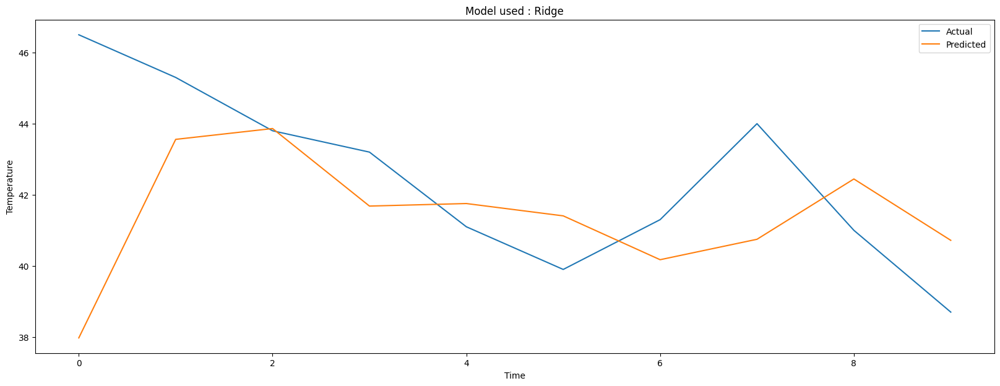

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

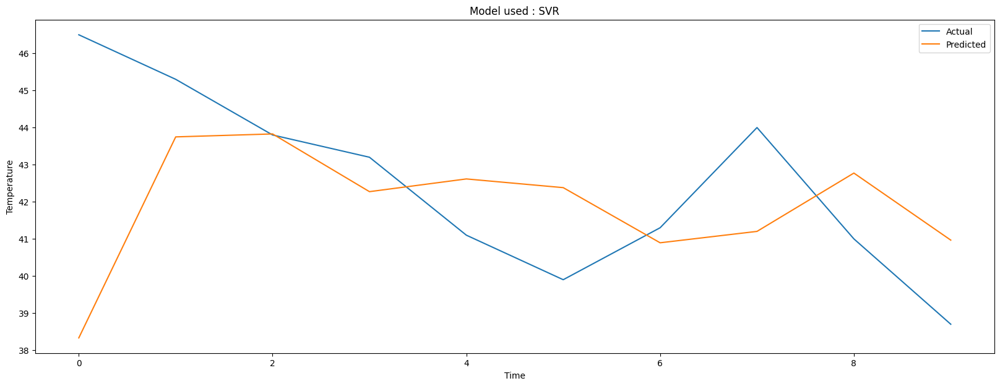

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

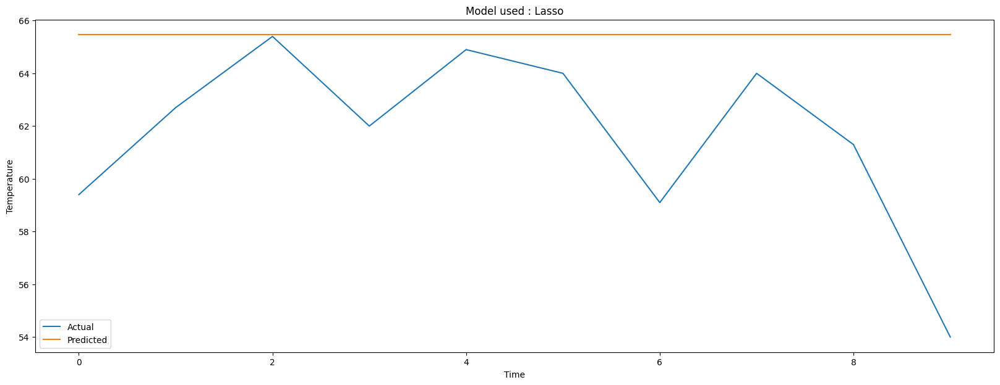

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

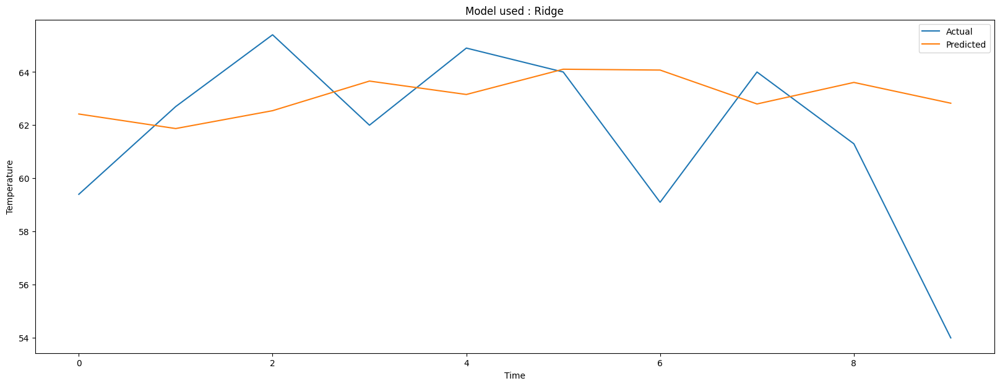

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

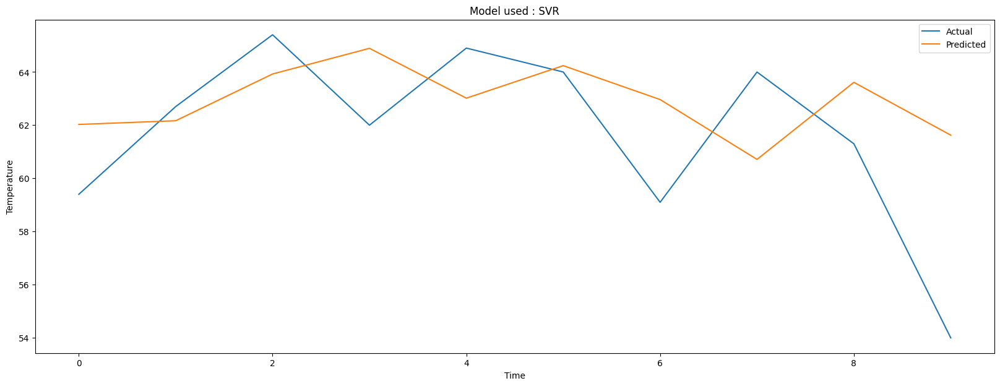

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

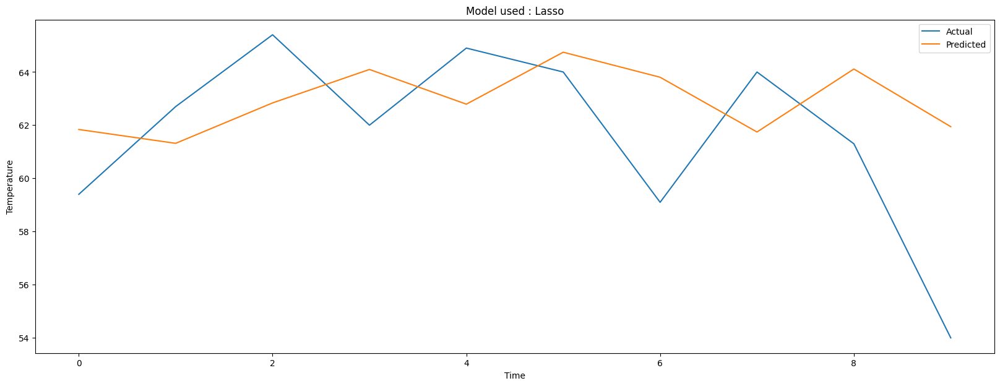

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

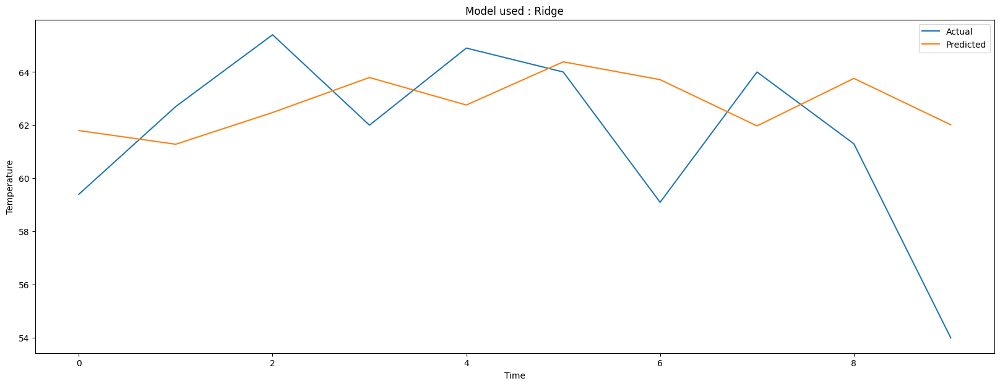

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

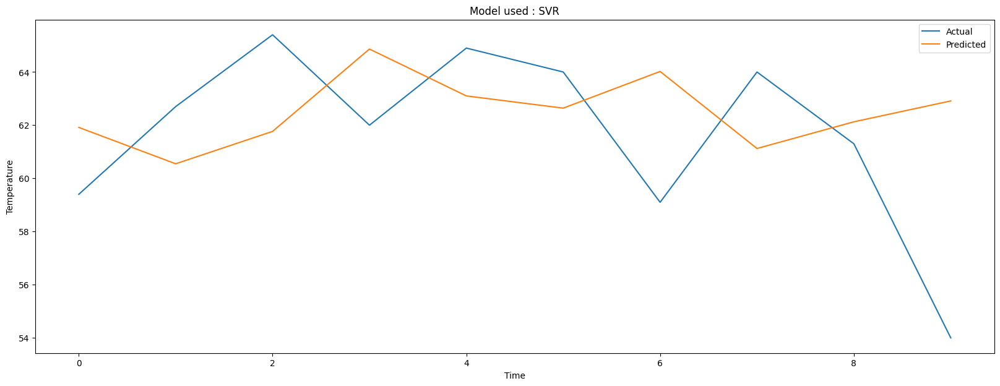

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

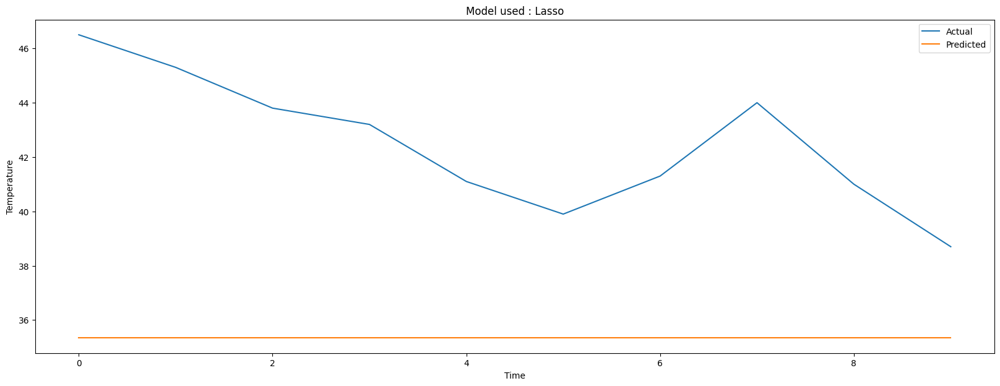

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

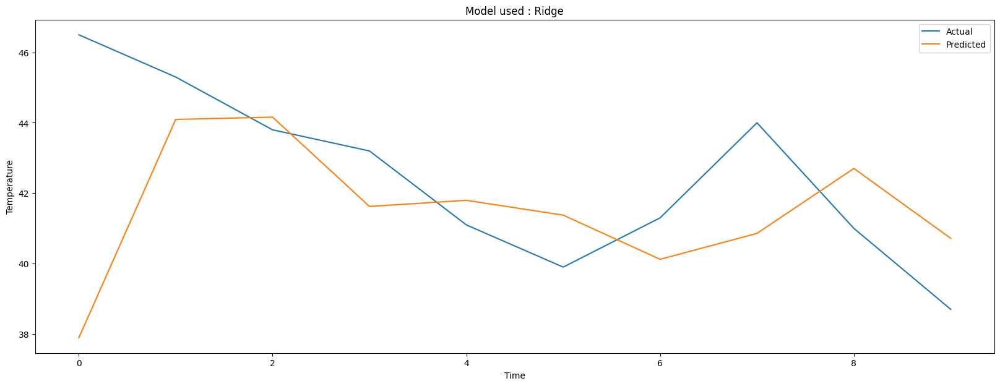

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

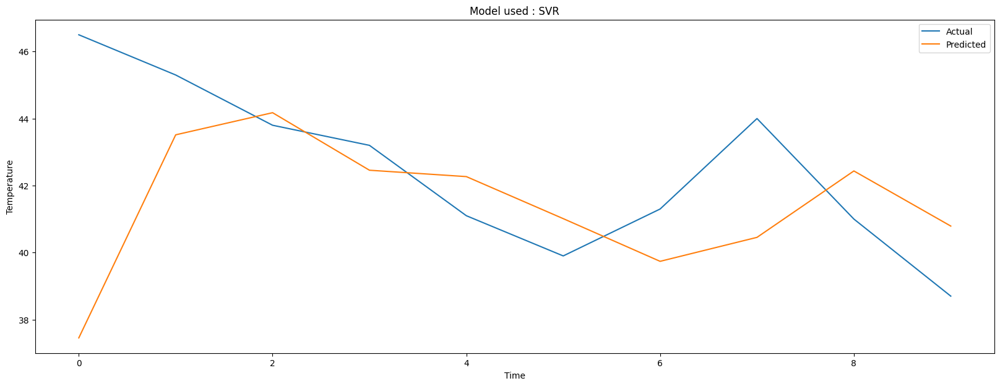

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

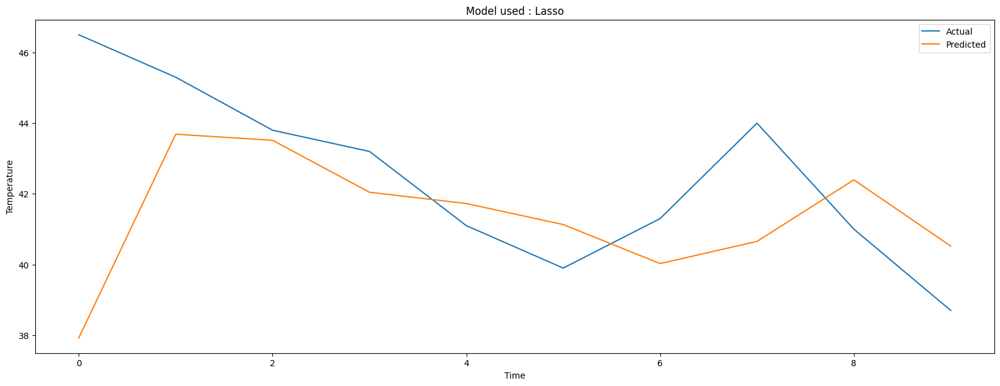

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

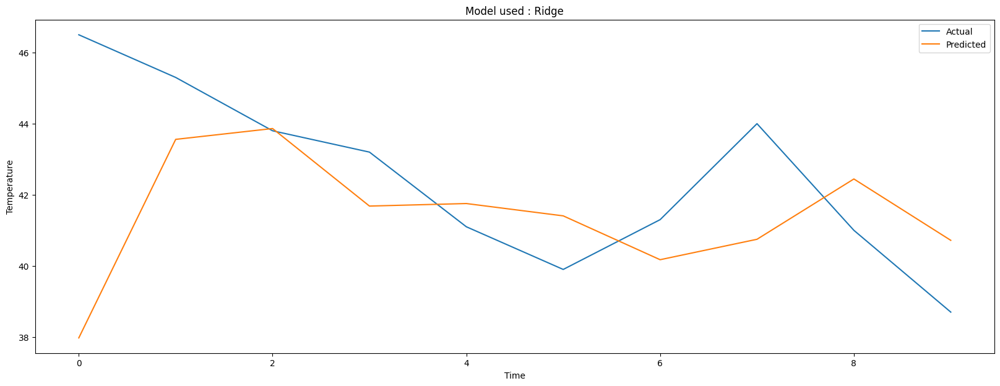

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

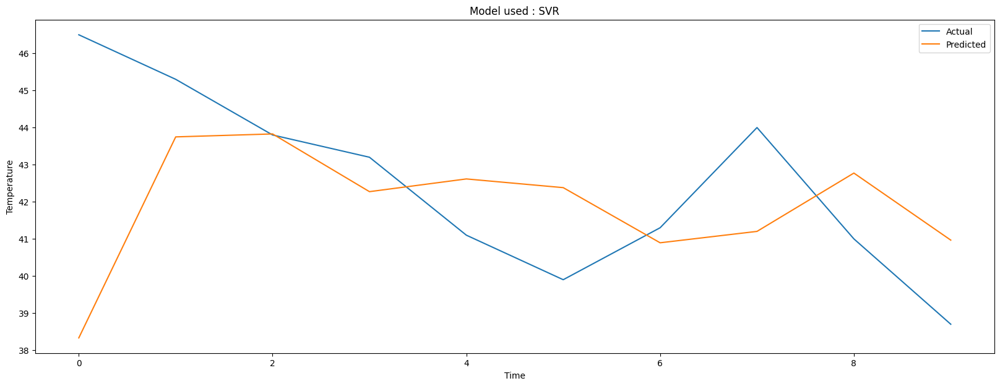

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

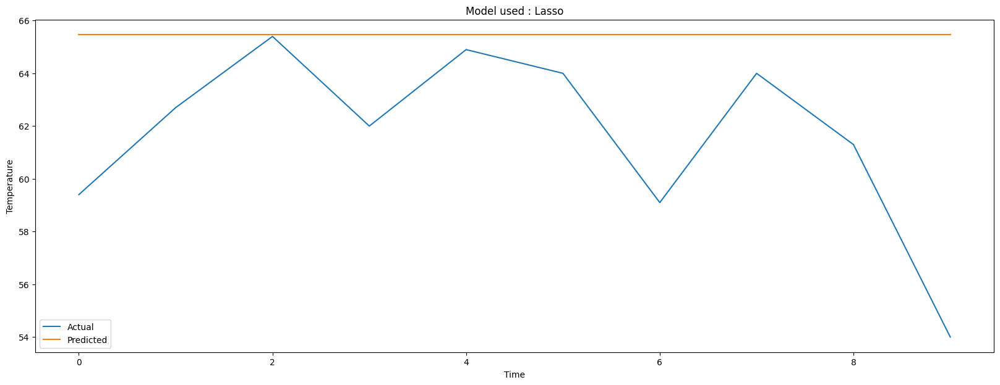

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

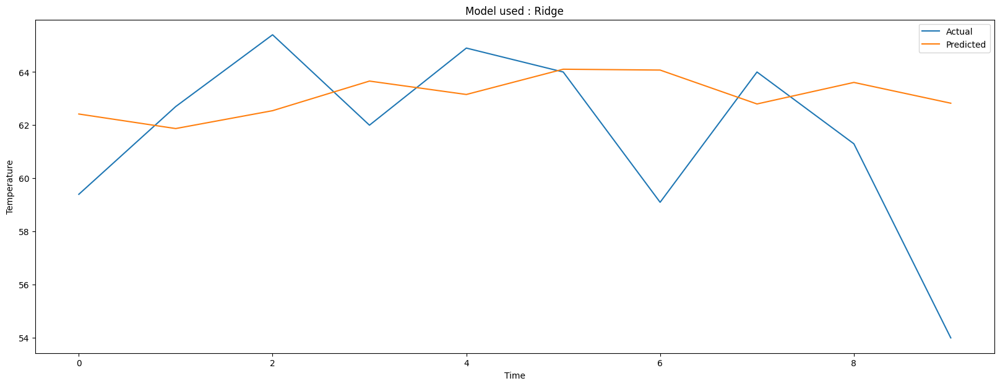

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

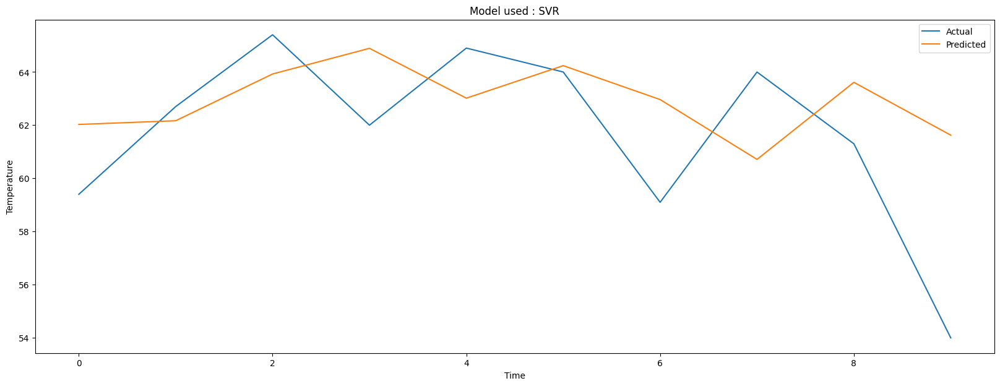

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

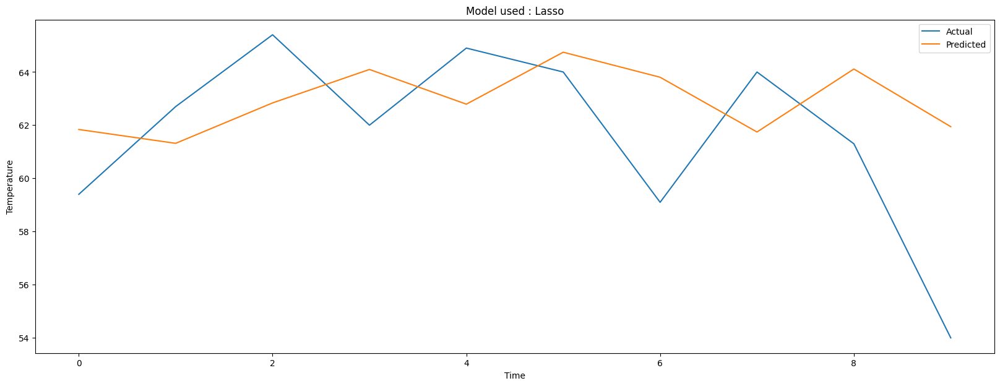

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

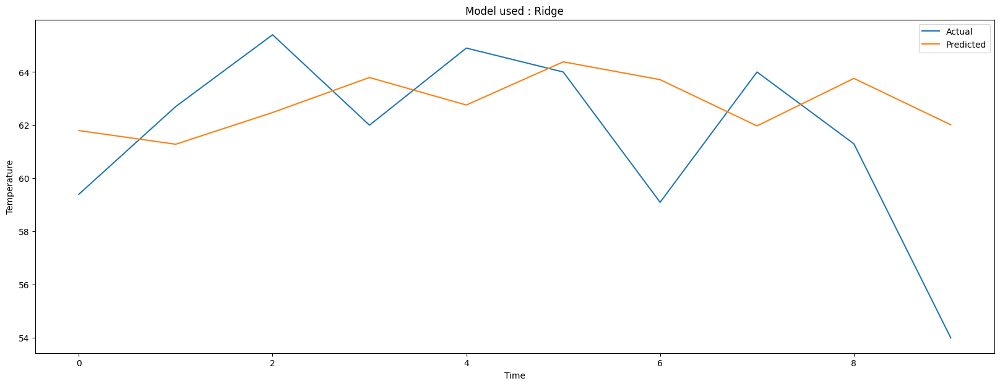

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

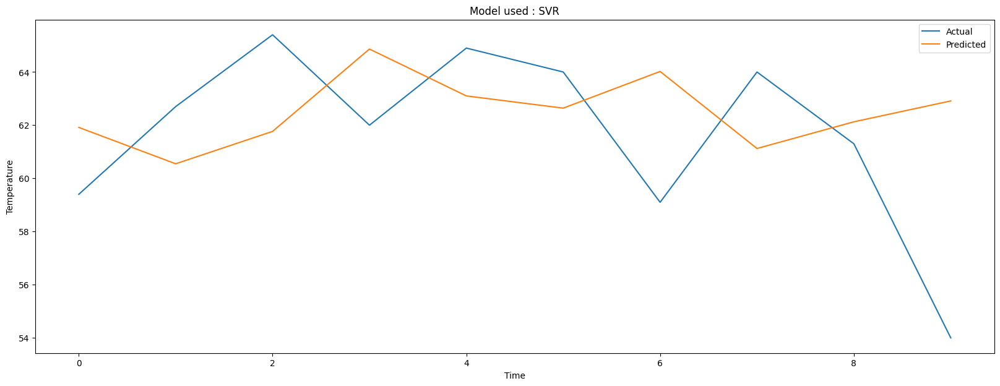

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

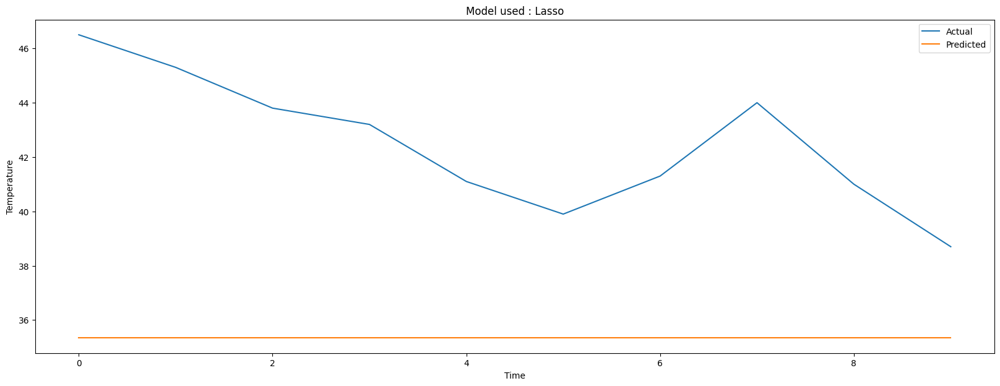

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

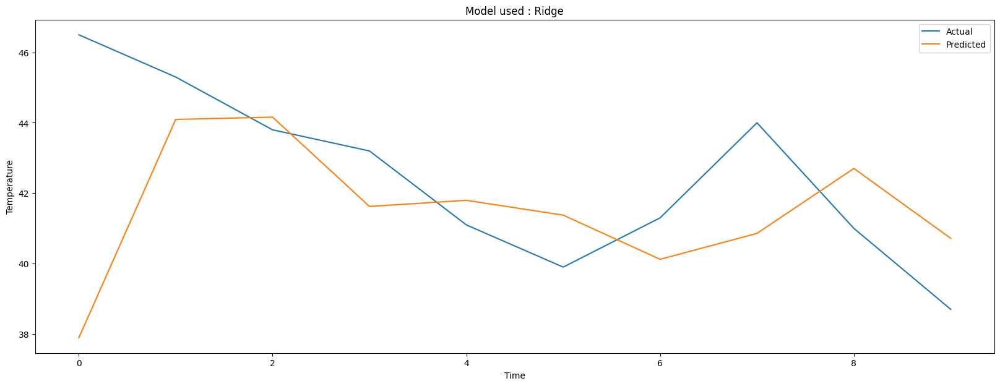

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

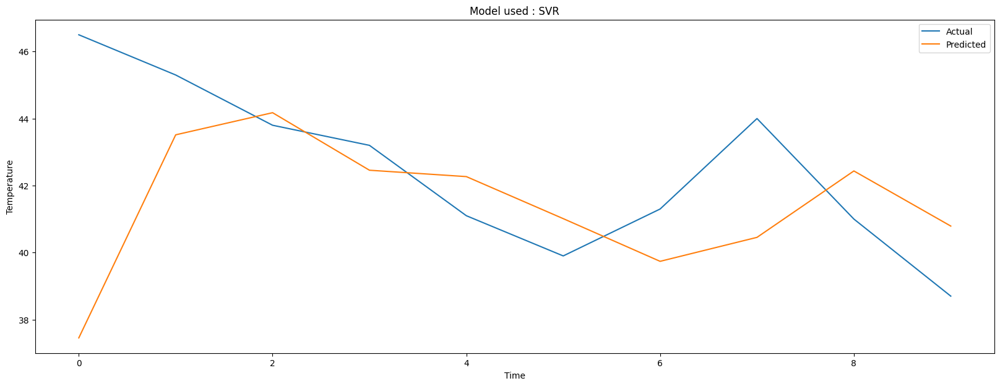

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

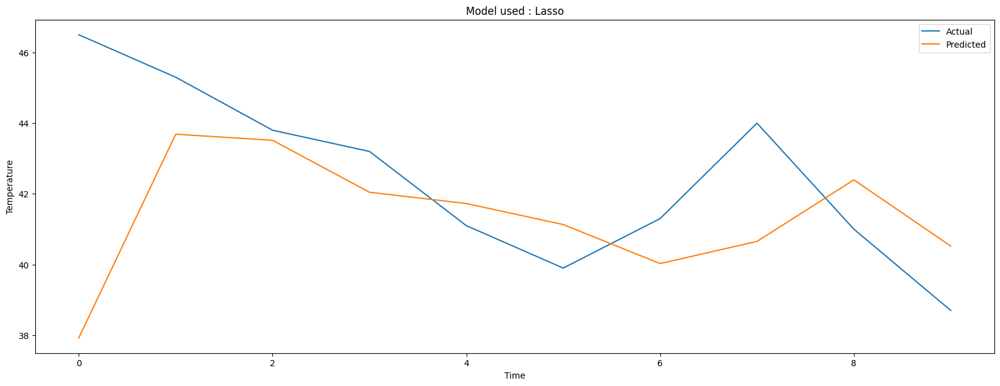

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

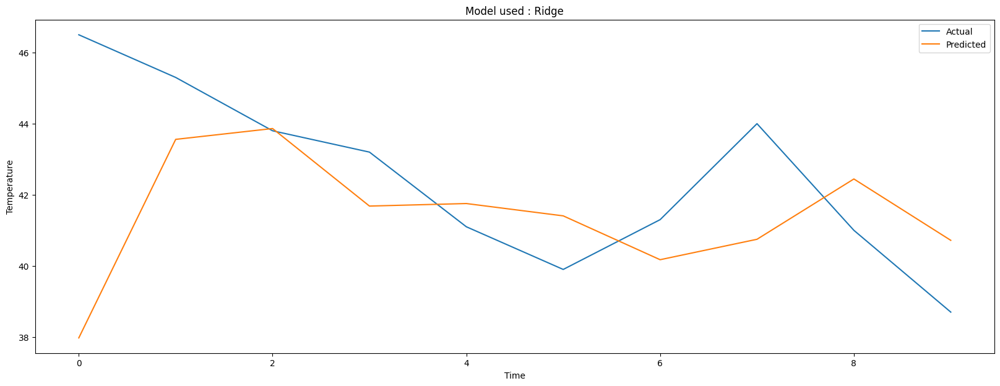

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

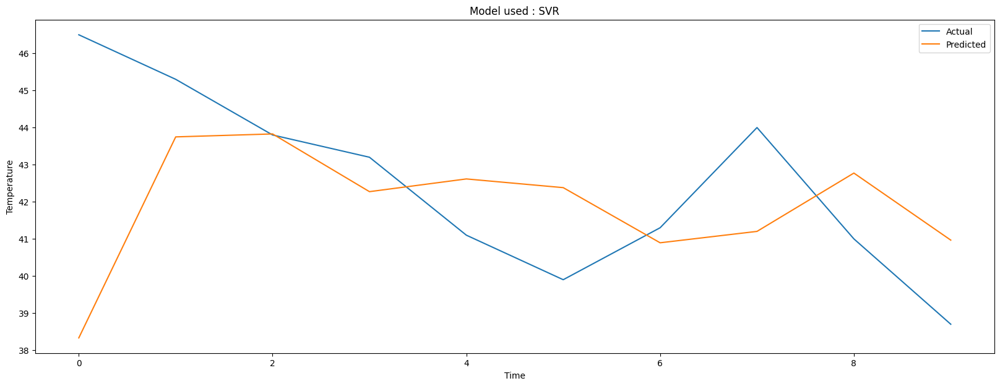

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

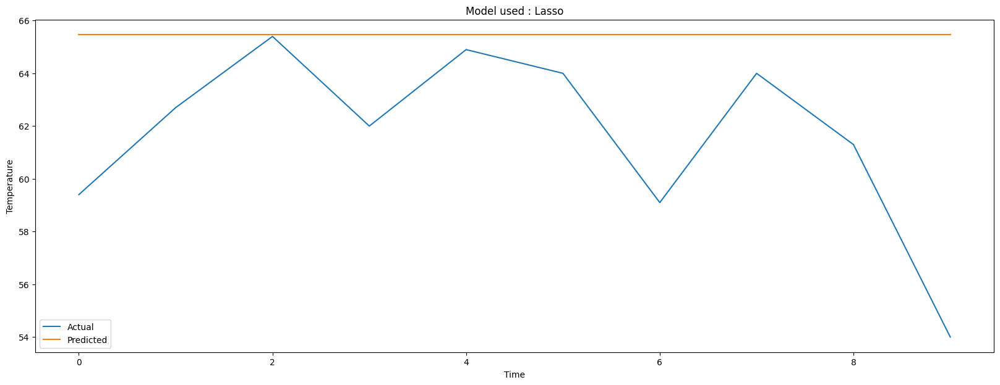

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

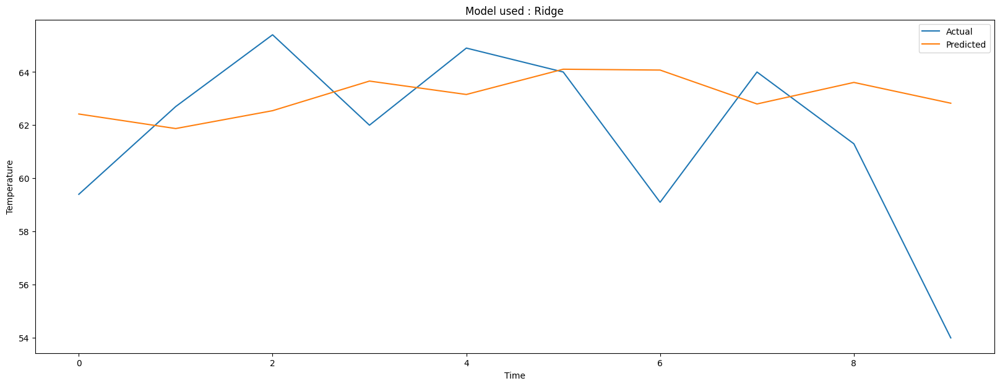

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

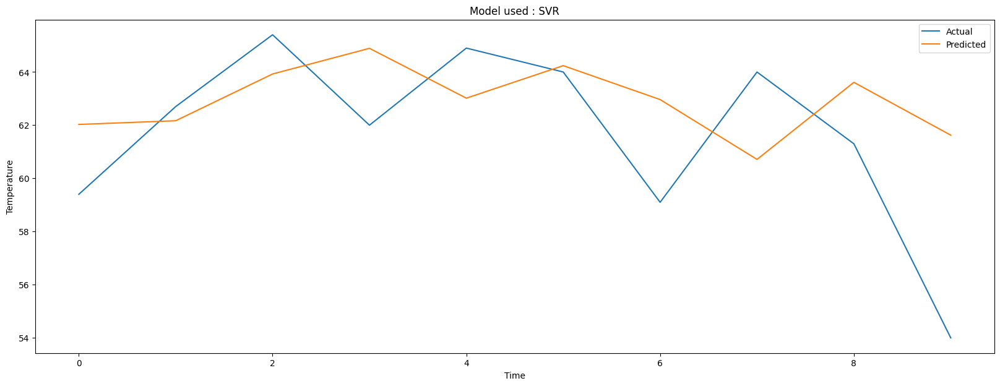

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

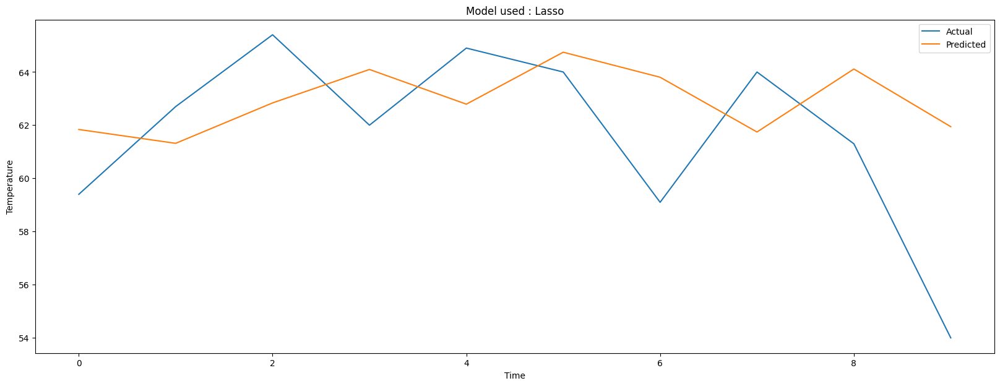

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

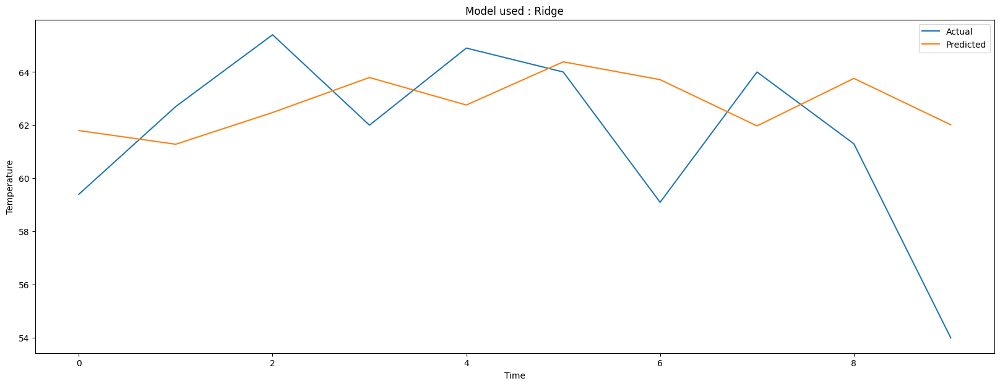

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

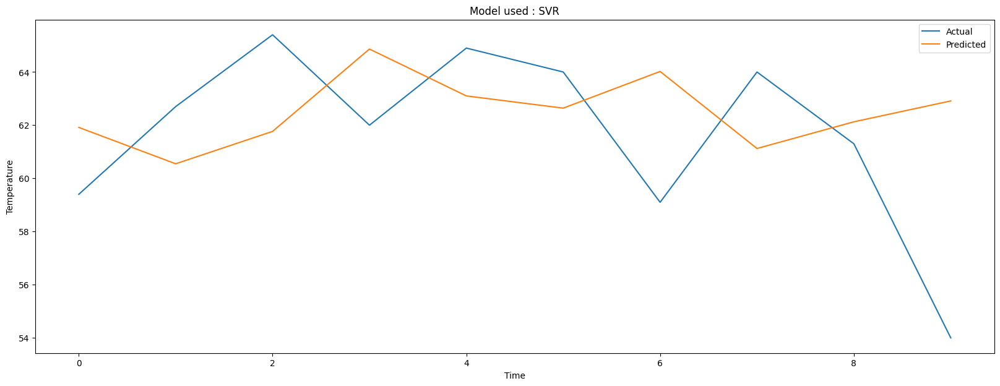

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

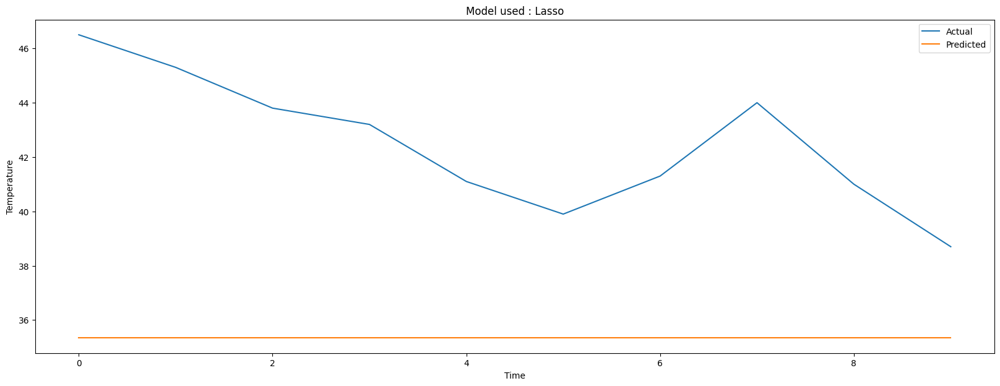

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

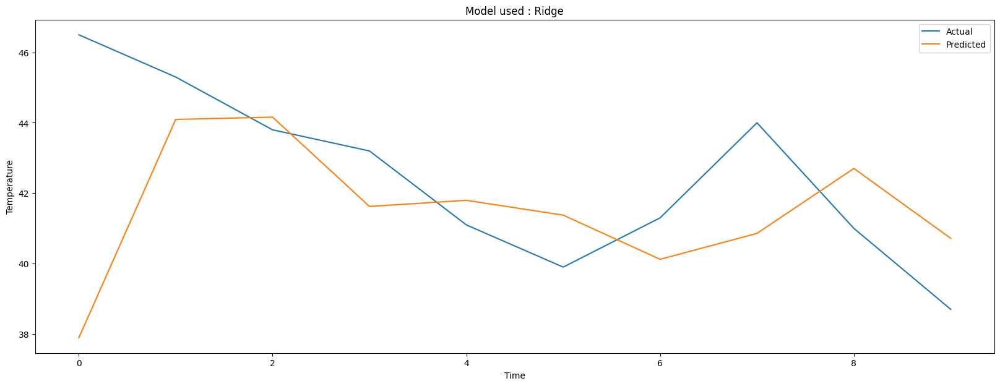

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

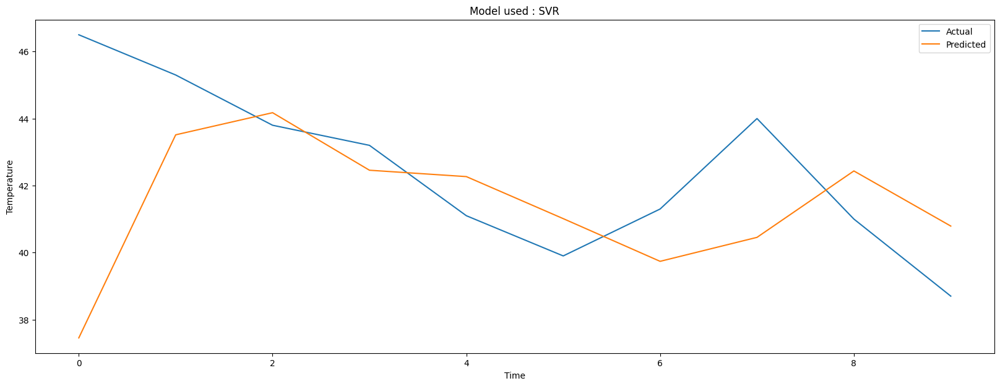

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

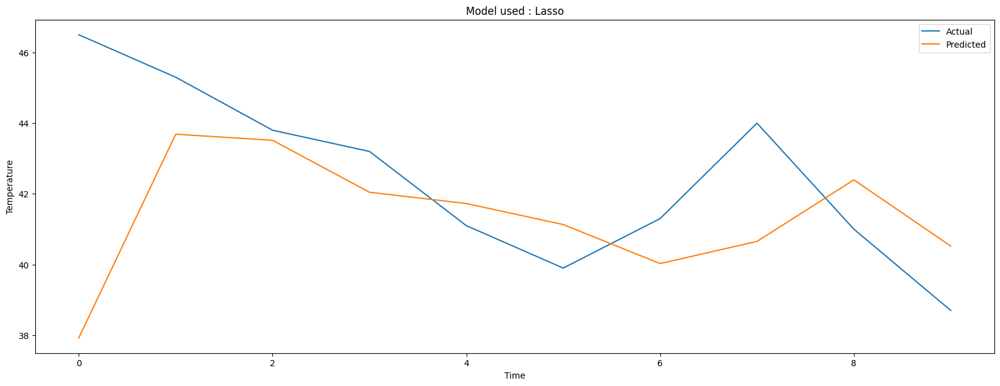

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

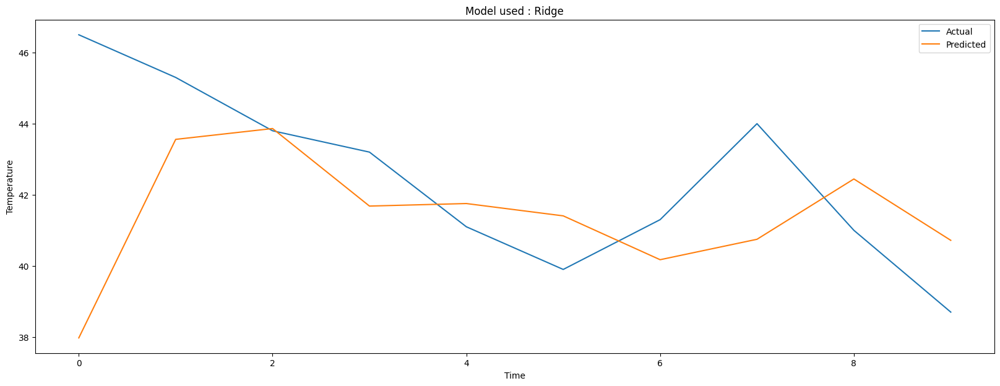

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

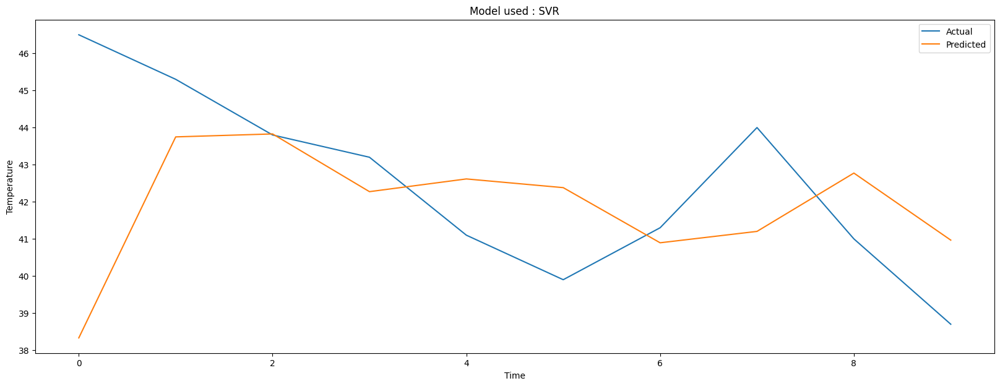

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

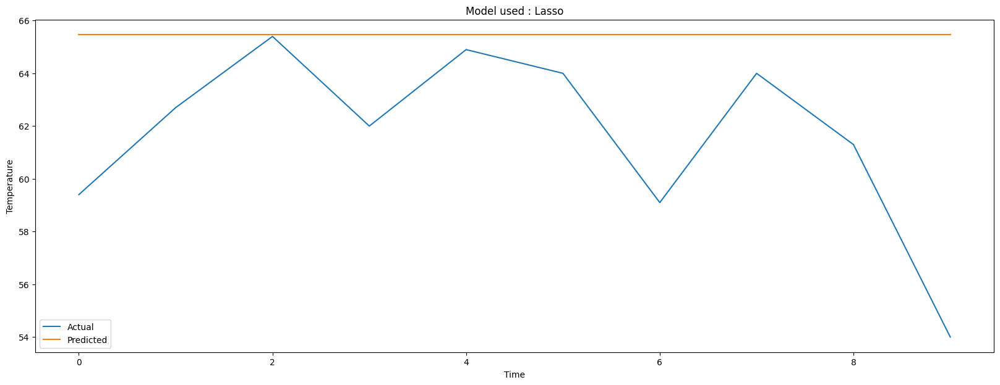

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

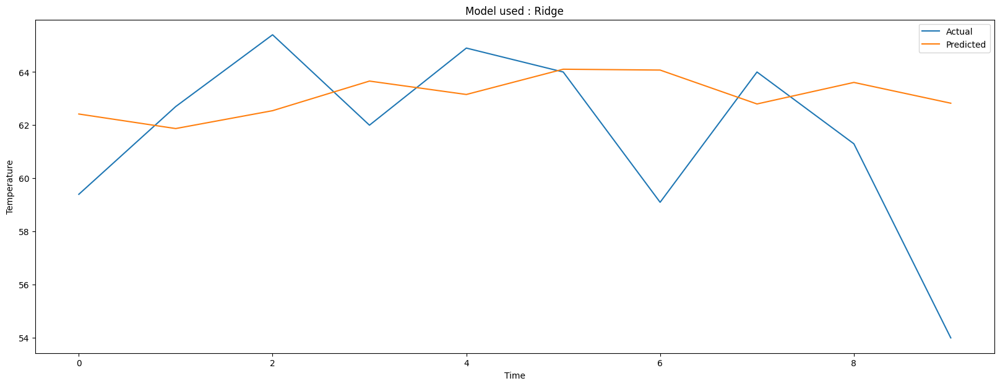

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

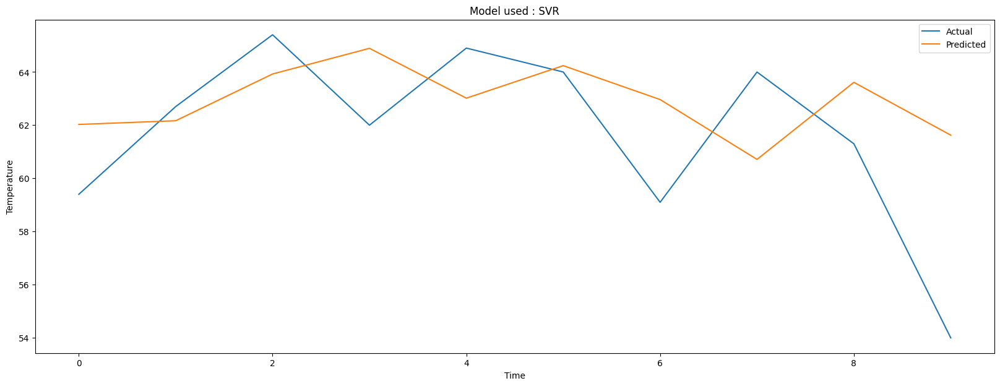

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

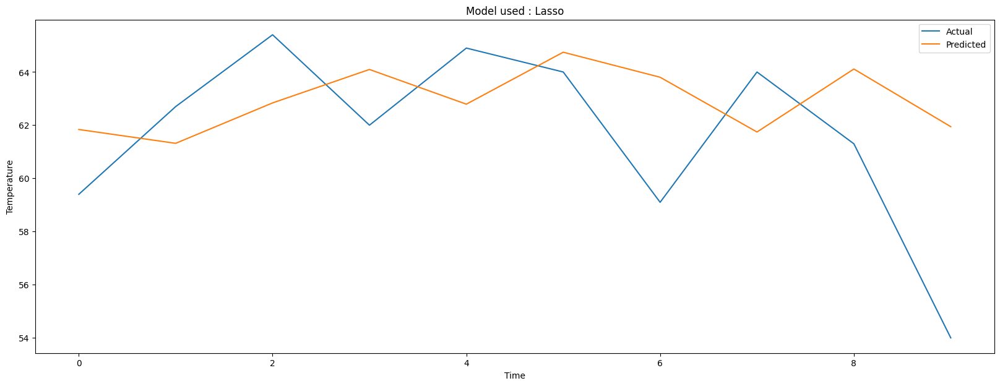

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

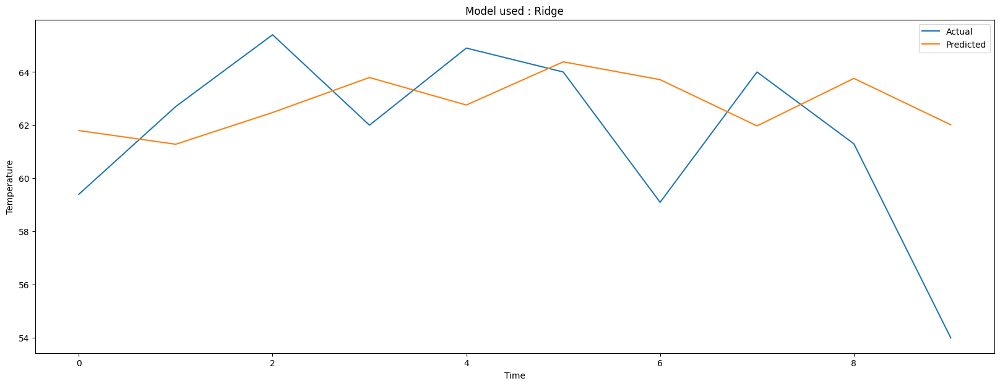

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

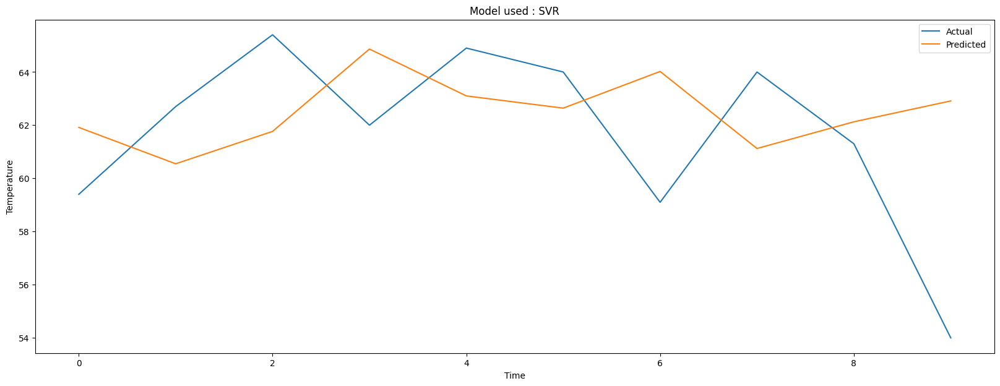

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; tota

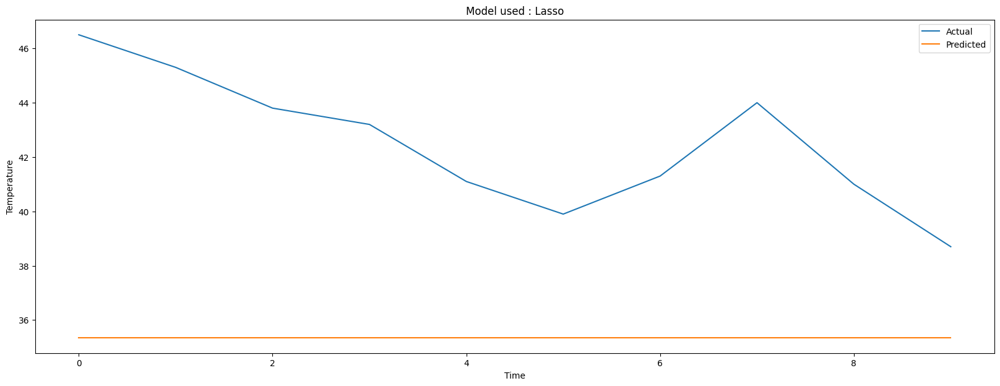

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

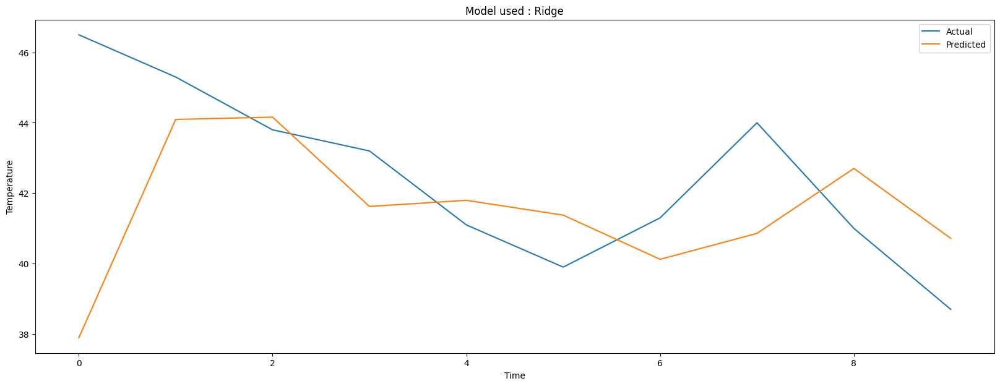

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

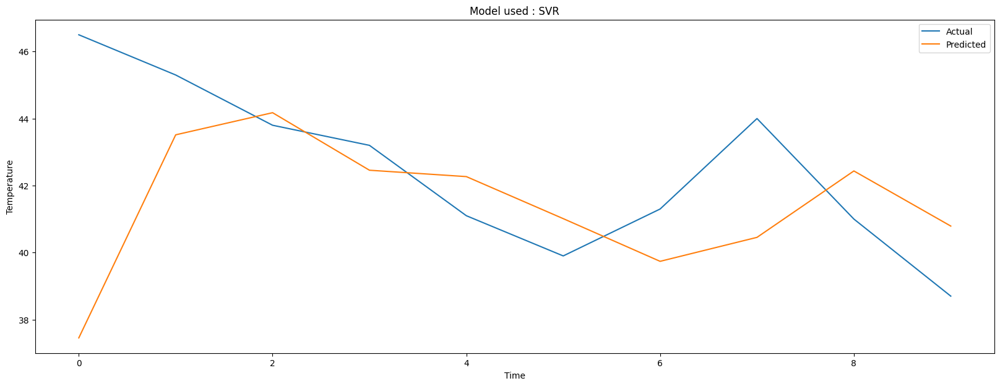

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 36.10870182668745
Test MSE : 56.44432122967248
Model used : Ridge
Best parameters : {'alpha': 0.01}
Validation MSE : 7.333427871204112
Test MSE : 9.909372821681703
Model used : SVR
Best parameters : {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 6.467309451130664
Test MSE : 10.97674595844392
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0

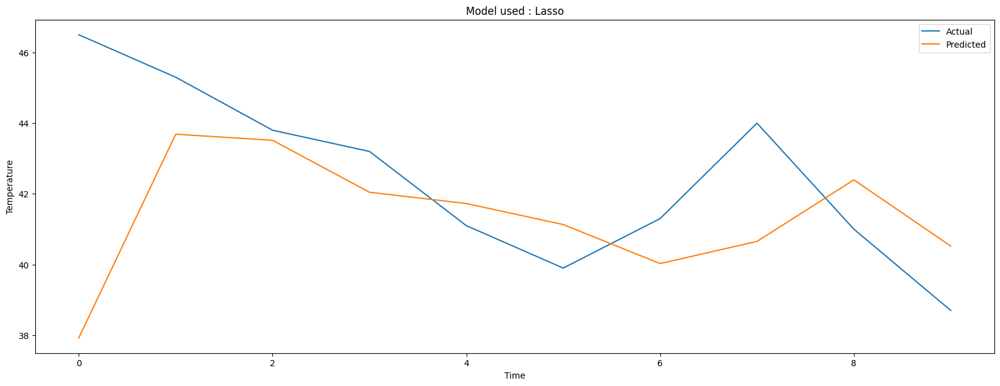

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

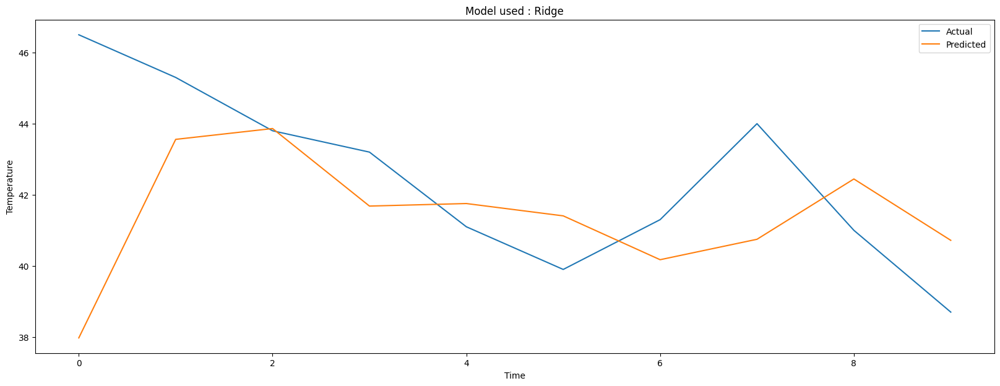

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

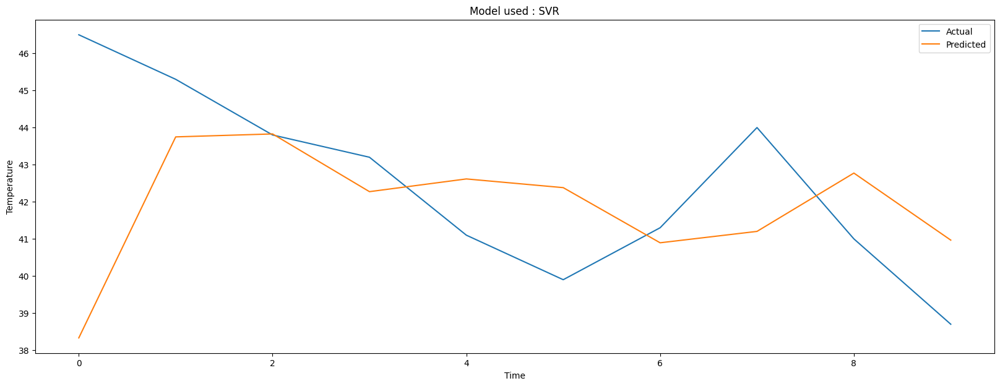

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 6.783463327530002
Test MSE : 9.75362351847451
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 7.594054203964767
Test MSE : 9.872187672206799
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
Validation MSE : 6.481627055219295
Test MSE : 9.470990827653146
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; to

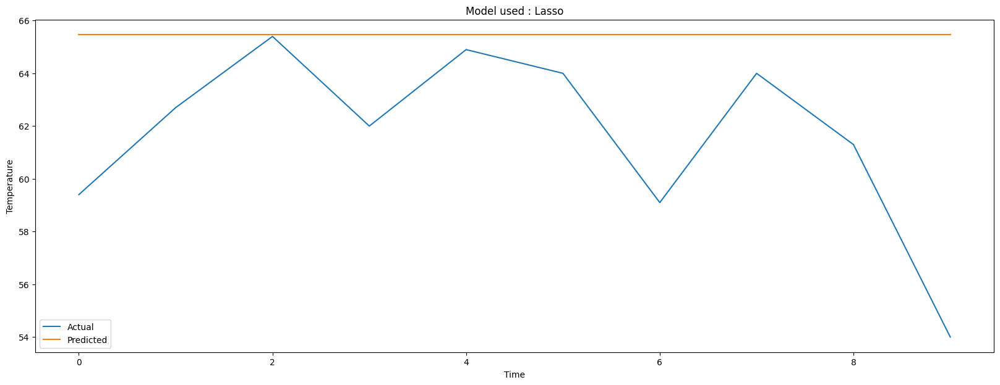

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

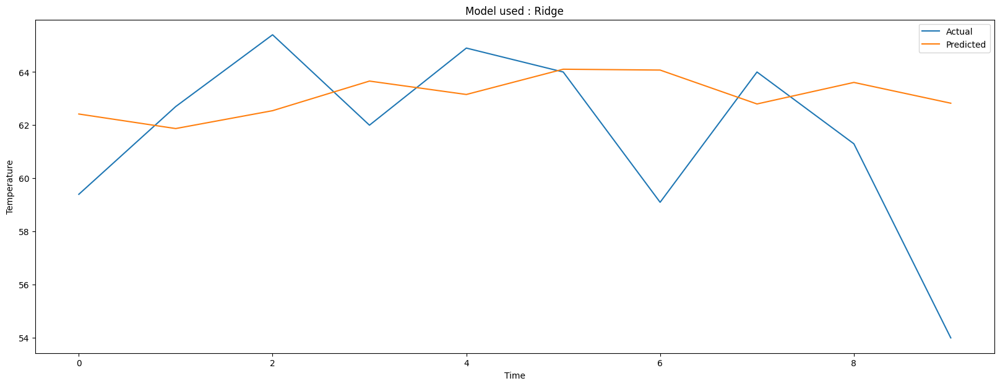

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

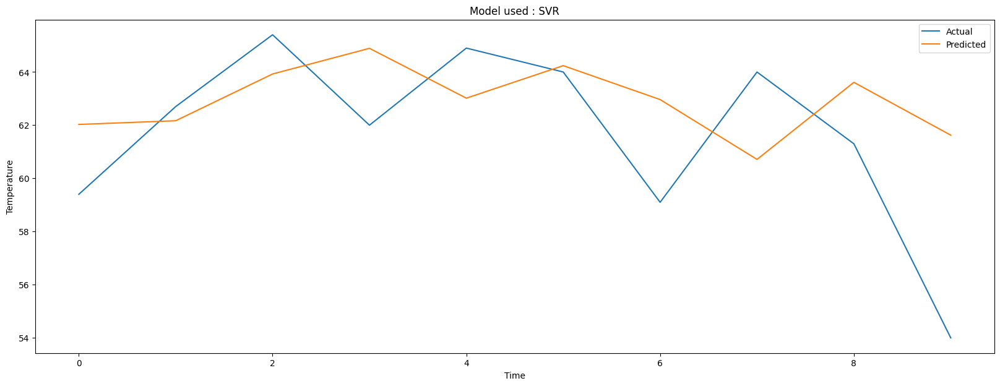

Model used : Lasso
Best parameters : {'alpha': 0.1}
Validation MSE : 17.759667242147458
Test MSE : 25.040909779460925
Model used : Ridge
Best parameters : {'alpha': 1}
Validation MSE : 5.56625423231731
Test MSE : 13.316995607626087
Model used : SVR
Best parameters : {'C': 1, 'gamma': 1, 'kernel': 'rbf'}
Validation MSE : 4.731562646200986
Test MSE : 11.052053522538156
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV] END ..........................................alpha=0.4; total time=   0.0s
[CV

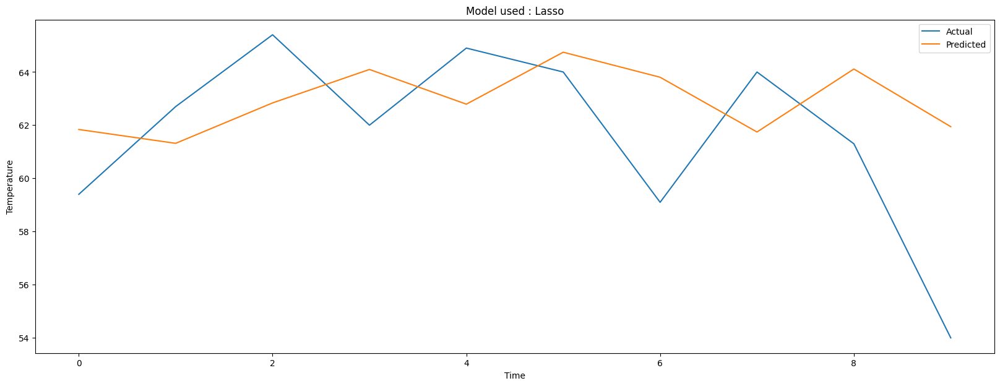

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-15; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-10; total time=   0.0s
[CV] END ........................................alpha=1e-08; total time=   0.0s
[CV] END .......................................

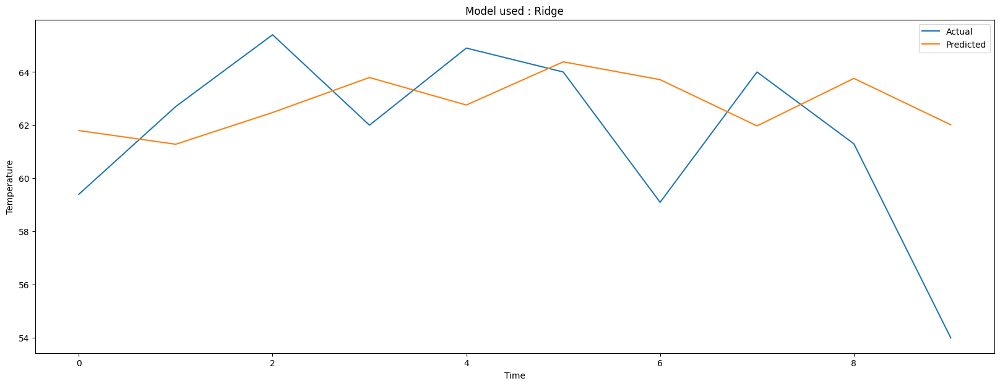

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.0

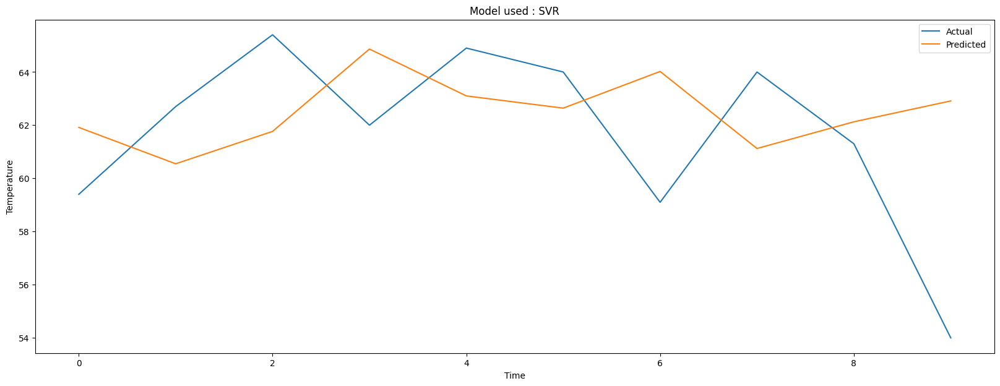

Model used : Lasso
Best parameters : {'alpha': 0.7000000000000001}
Validation MSE : 4.77053921105335
Test MSE : 12.2039632512509
Model used : Ridge
Best parameters : {'alpha': 100}
Validation MSE : 4.70214524813368
Test MSE : 11.99286584011249
Model used : SVR
Best parameters : {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Validation MSE : 5.623987338934505
Test MSE : 15.005040015046433


In [144]:
rey=IS507ForecastModels(df_rey,5,models,param_grids,True,True)
rey_nonStandard=IS507ForecastModels(df_rey,5,models,param_grids,True,False)
cap=IS507ForecastModels(df_cap,5,models,param_grids,True,True)
cap_nonStandard=IS507ForecastModels(df_cap,5,models,param_grids,True,False)
results_dict={}
for i in range(10):
  results_dict["REY"+str(i)]=rey.train()
  results_dict["REY"+str(i)+"nonStandard"]=rey_nonStandard.train()
  results_dict["CAP"+str(i)]=cap.train()
  results_dict["CAP"+str(i)+"nonStandard"]=cap_nonStandard.train()

In [145]:
results_dict

{'REY0': {'Lasso': {'Best parameters': {'alpha': 0.1},
   'Validation MSE': 36.10870182668745,
   'Test MSE': 56.44432122967248},
  'Ridge': {'Best parameters': {'alpha': 0.01},
   'Validation MSE': 7.333427871204112,
   'Test MSE': 9.909372821681703},
  'SVR': {'Best parameters': {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'},
   'Validation MSE': 6.467309451130664,
   'Test MSE': 10.97674595844392}},
 'REY0nonStandard': {'Lasso': {'Best parameters': {'alpha': 0.7000000000000001},
   'Validation MSE': 6.783463327530002,
   'Test MSE': 9.75362351847451},
  'Ridge': {'Best parameters': {'alpha': 100},
   'Validation MSE': 7.594054203964767,
   'Test MSE': 9.872187672206799},
  'SVR': {'Best parameters': {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'},
   'Validation MSE': 6.481627055219295,
   'Test MSE': 9.470990827653146}},
 'CAP0': {'Lasso': {'Best parameters': {'alpha': 0.1},
   'Validation MSE': 17.759667242147458,
   'Test MSE': 25.040909779460925},
  'Ridge': {'Best parameters': {'alp

In [147]:
results_list = []

for key, value in results_dict.items():
    for model, metrics in value.items():
        metrics['Model'] = model
        metrics['Run'] = key
        results_list.append(metrics)

df_results = pd.DataFrame(results_list)

df_results

,Best parameters,Validation MSE,Test MSE,Model,Run
0,{'alpha': 0.1},36.108702,56.444321,Lasso,REY0
1,{'alpha': 0.01},7.333428,9.909373,Ridge,REY0
2,"{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}",6.467309,10.976746,SVR,REY0
3,{'alpha': 0.7000000000000001},6.783463,9.753624,Lasso,REY0nonStandard
4,{'alpha': 100},7.594054,9.872188,Ridge,REY0nonStandard
...,...,...,...,...,...
115,{'alpha': 1},5.566254,13.316996,Ridge,CAP9
116,"{'C': 1, 'gamma': 1, 'kernel': 'rbf'}",4.731563,11.052054,SVR,CAP9
117,{'alpha': 0.7000000000000001},4.770539,12.203963,Lasso,CAP9nonStandard
118,{'alpha': 100},4.702145,11.992866,Ridge,CAP9nonStandard


In [181]:
df_results.to_csv('results.csv', index=False)

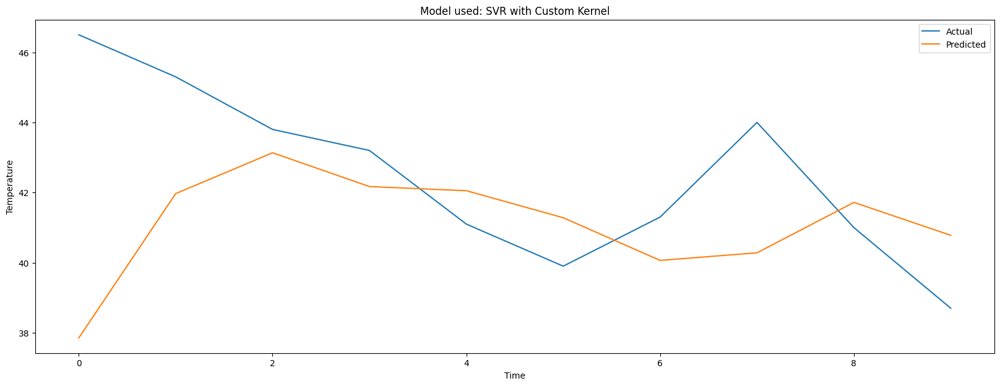

Validation MSE: 7.462964905067652
Test MSE: 11.036021332311872


In [163]:
rey.train_with_custom_kernel()

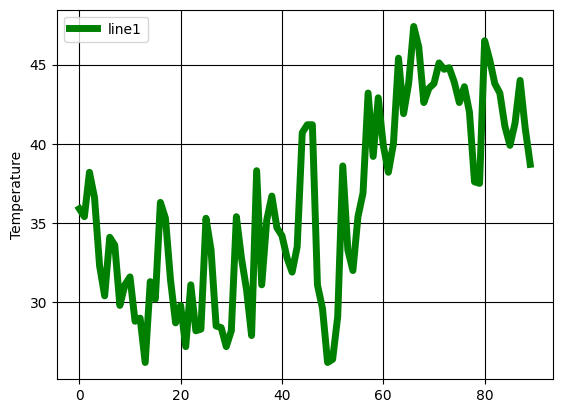

Validation MSE: 36.260000000000005
Test MSE: 63.728500000000075
Validation MSE: 14.798510675820337
Test MSE: 17.340044159318772
Validation MSE: 10.77083090607755
Test MSE: 13.045306385714914
Validation MSE: 9.941107433276454
Test MSE: 13.064576251987853
Validation MSE: 9.062864478901124
Test MSE: 11.220538680273535
Validation MSE: 8.76581542147419
Test MSE: 11.36443827427891
Validation MSE: 8.420522474800899
Test MSE: 11.08002032787207
Validation MSE: 8.255265086253411
Test MSE: 11.133238831467306
Validation MSE: 7.926111628965833
Test MSE: 11.239760117977614
Validation MSE: 7.513886461029311
Test MSE: 10.671905393432617
Validation MSE: 7.462964905067652
Test MSE: 11.036021332311872
Validation MSE: 7.415254807010844
Test MSE: 11.327183264386473
Validation MSE: 7.342573288170441
Test MSE: 11.386158397179715
Validation MSE: 7.287104584700155
Test MSE: 11.291107105416575
Validation MSE: 7.240568514187271
Test MSE: 11.205770561070631
Validation MSE: 7.151660724789764
Test MSE: 11.051647613

In [179]:
rey_custom=IS507ForecastModels(df_rey,5,models,param_grids,True,True)
results_custom_rey={}
for id,i in enumerate(np.arange(0,0.5,0.01)):
  results_custom_rey[id]=rey_custom.train_with_custom_kernel(i)

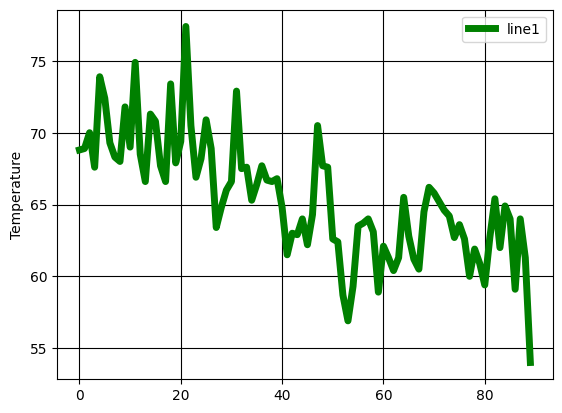

Validation MSE: 18.448750000000008
Test MSE: 23.813999999999982
Validation MSE: 13.282159632241193
Test MSE: 17.051688873158334
Validation MSE: 11.018780473323933
Test MSE: 15.424789020211701
Validation MSE: 10.089725371159988
Test MSE: 14.895742611937624
Validation MSE: 9.061948248347921
Test MSE: 14.299793936790644
Validation MSE: 8.58987798420766
Test MSE: 14.102373528682378
Validation MSE: 6.932679069730896
Test MSE: 13.701209677941645
Validation MSE: 6.734513825866021
Test MSE: 13.706497489683809
Validation MSE: 6.4797587206161085
Test MSE: 13.414376951050434
Validation MSE: 6.236652351513646
Test MSE: 13.114003362922915
Validation MSE: 6.003465816847761
Test MSE: 12.825691535105324
Validation MSE: 5.727885403421136
Test MSE: 12.672769656192642
Validation MSE: 5.419987291819233
Test MSE: 12.602266015573514
Validation MSE: 4.6378718890116435
Test MSE: 12.710000954860806
Validation MSE: 4.526181947894739
Test MSE: 12.647229381413545
Validation MSE: 4.441928988296362
Test MSE: 12.590

In [175]:
cap_custom=IS507ForecastModels(df_cap,5,models,param_grids,True,True)
results_custom_cap={}
for id,i in enumerate(np.arange(0,0.5,0.01)):
  results_custom_cap[id]=cap_custom.train_with_custom_kernel(i)

In [180]:
rey_custom_df=pd.DataFrame(results_custom_rey).T
rey_custom_df

,Best parameters,Validation MSE,Test MSE
0,0.00,36.260000,63.728500
1,0.01,14.798511,17.340044
2,0.02,10.770831,13.045306
3,0.03,9.941107,13.064576
4,0.04,9.062864,11.220539
5,0.05,8.765815,11.364438
6,0.06,8.420522,11.080020
7,0.07,8.255265,11.133239
8,0.08,7.926112,11.239760
9,0.09,7.513886,10.671905


In [178]:
cap_custom_df=pd.DataFrame(results_custom_cap).T
cap_custom_df

,Best parameters,Validation MSE,Test MSE
0,0.00,18.448750,23.814000
1,0.01,13.282160,17.051689
2,0.02,11.018780,15.424789
3,0.03,10.089725,14.895743
4,0.04,9.061948,14.299794
5,0.05,8.589878,14.102374
6,0.06,6.932679,13.701210
7,0.07,6.734514,13.706497
8,0.08,6.479759,13.414377
9,0.09,6.236652,13.114003


##INSIGHTS

1. Model Performance Comparison

    SVR Model: Consistently performs well with {'C': 1, 'gamma': 1, 'kernel': 'rbf'}, achieving low test MSE values (around 11.052)1


- Ridge Model: Stable performance with alpha = 1, showing test MSE values around 13.3161

- Lasso Model: Varying performance with alpha = 0.7000000000000001, resulting in test MSE values ranging from 9.753 to 12.2031


2. Parameter Sensitivity

    Lasso Model: Highly sensitive to alpha, with alpha = 0.1 leading to significantly higher test MSE values (around 56.444) compared to alpha = 0.7000000000000001 (around 9.753)1


- Ridge Model: Less sensitive to alpha, with similar test MSE values for alpha = 0.01 and alpha = 100 (around 9.909 and 9.872, respectively)

3. Consistency Across Runs

    SVR Model: Consistent performance across different runs, indicating robustness
Ridge and Lasso Models: Varying performance but within a similar range, indicating some level of consistency1

    

4. Non-Standard vs. Standard Models

    Non-Standard Models: Often perform better than standard counterparts, suggesting the importance of parameter tuning1

    

Additional Insights

  1.SVR Parameter Tuning: Further improvement possible by tuning C and gamma1

2.Model Selection: SVR model with {'C': 1, 'gamma': 1, 'kernel': 'rbf'} appears to be the best choice for this dataset1
